# K-Means Cluster

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn import metrics
from clustering_utils import *

## Load the Data

In [2]:
df = pd.read_csv("../dataset/cleaned_user_profiles.csv", index_col=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11508 entries, 2353593986 to 933183398
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   name                    11508 non-null  object 
 1   lang                    11508 non-null  object 
 2   bot                     11508 non-null  int64  
 3   created_at              11508 non-null  object 
 4   statuses_count          11508 non-null  int64  
 5   avg_length              11508 non-null  float64
 6   avg_special_chars       11508 non-null  float64
 7   urls_ratio              11508 non-null  float64
 8   mentions_ratio          11508 non-null  float64
 9   hashtags_ratio          11508 non-null  float64
 10  reply_count_mean        11508 non-null  float64
 11  reply_count_std         11508 non-null  float64
 12  favorite_count_mean     11508 non-null  float64
 13  favorite_count_std      11508 non-null  float64
 14  favorite_count_entropy  1

loaded the data, we separate the numerical features (used to run the clustering algorithms) and the categorical ones (used to understand the results of the clustering algorithms)

In [4]:
# remove categorical features
cat_features = ["name", "lang", "bot", "created_at"]
df_cat = df[cat_features]
df_num = df.loc[:, ~df.columns.isin(cat_features)]

In [5]:
df_cat.head()

,name,lang,bot,created_at
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56
466124818,Carletto Focia,it,1,2017-01-18 02:49:18
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21


In [6]:
df_num.head()

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
2353593986,76,62.340909,14.015152,0.000000,0.272727,0.098485,0.0,0.0,0.037879,0.190903,0.232481,0.037879,0.190903,0.232481
2358850842,54,69.082645,15.041322,0.000000,0.338843,0.024793,0.0,0.0,0.049587,0.217090,0.284639,0.024793,0.155495,0.167568
137959629,53,65.340909,14.694444,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
466124818,50,86.944871,18.689463,0.022331,0.006281,0.072575,0.0,0.0,0.165387,0.530838,0.669155,0.826239,13.034008,0.392850
2571493866,7085,72.311246,14.582073,0.000825,0.506461,0.118229,0.0,0.0,0.056365,0.243387,0.317182,0.016772,0.142619,0.120737


## Preprocessing

First apply the log scale of the feature with a skewed distribution (see DataProfileUnderstanding.ipynb), following the results presented in data understanding of the profiling.

In [7]:
# TODO : Review the DataUnderstandingProfiling

skewed_features = [
    "statuses_count",
    "avg_special_chars",
    "urls_ratio",
    "mentions_ratio",
    "hashtags_ratio",
    "reply_count_mean",
    "reply_count_std",
    "favorite_count_mean",
    "favorite_count_std",
    "retweet_count_mean",
    "retweet_count_std"]

df_num_not_skewed = preprocess_skewed_features(df_num, skewed_features)

Apply Standard Scaling as preprocessing step

In [8]:
scaler = StandardScaler()

In [9]:
X = scaler.fit_transform(df_num_not_skewed.values)

Apply the k-means algorithm, for max_k iteration try different values of the K parameter, select out the best with respect to the SSE, Separation and Silouettes curves.

In [10]:
sse_list = list()
separations = list()
silouettes_ = list()

max_k = 25
for k in tqdm(range(2, max_k + 1)):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X)
    
    sse = kmeans.inertia_
    sse_list.append(sse)
    separations.append(metrics.davies_bouldin_score(X, kmeans.labels_))
    silouettes_.append(silhouette_score(X, kmeans.labels_))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:48<00:00,  2.01s/it]


Plotting SSE Curve

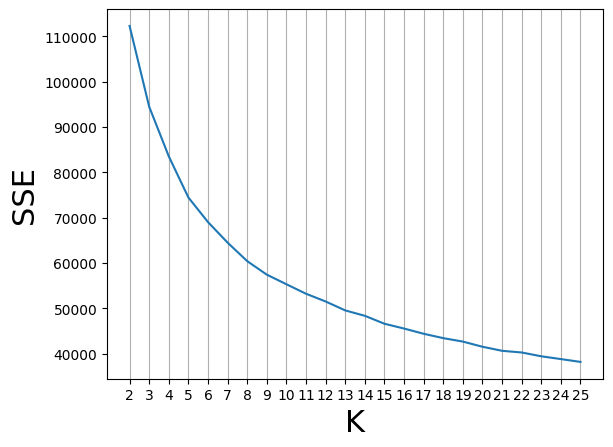

In [11]:
plt.plot(range(2, len(sse_list) + 2), sse_list)
plt.ylabel('SSE', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.xticks(range(2, len(sse_list) + 2))
plt.grid(True, axis="x")
plt.savefig("../images/clustering/kmeans_sse.png")
plt.show()

Plotting Separation Curve

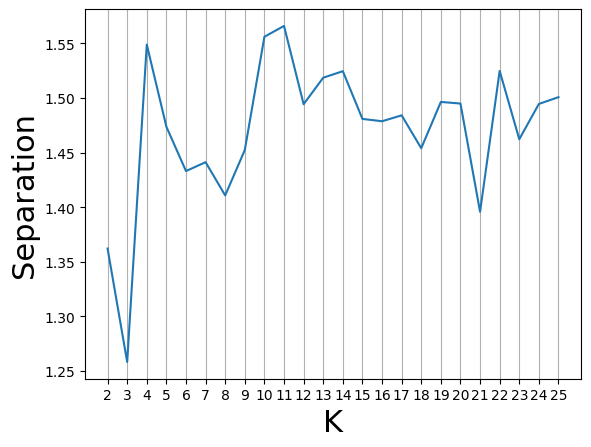

In [12]:
plt.plot(range(2, len(separations) + 2), separations)
plt.ylabel('Separation', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.xticks(range(2, len(separations) + 2))
plt.grid(True, axis="x")
plt.savefig("../images/clustering/kmeans_separation.png")
plt.show()

Plotting Separation Curve

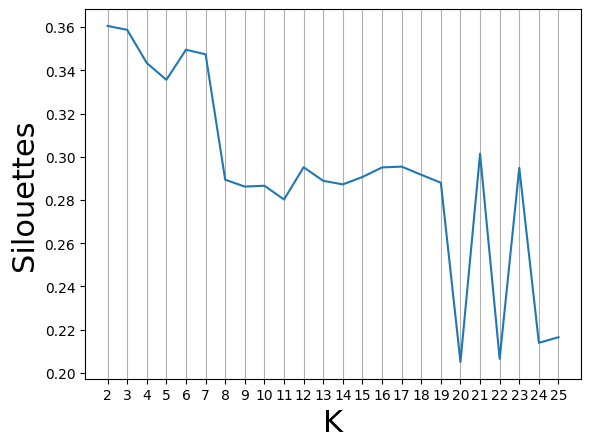

In [13]:
plt.plot(range(2, len(silouettes_) + 2), silouettes_)
plt.ylabel('Silouettes', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.xticks(range(2, len(silouettes_) + 2))
plt.grid(True, axis="x")
plt.savefig("../images/clustering/kmeans_silouettes.png")
plt.show()

Select out the best K, chose it properly using the plotted curves, we want the K that try to maximize the silouette, minimizing the Separation and the SSE at the same time.

We have choose 3 because even it is not in the elbo of SSE have better values for Separation and Silouette, we have tryed out even higher values of K that have less SSE gaining wrost results, comparing the semantic of features distributions in each cluster.

In [14]:
selected_k=3

Get the Kmeans clustering with selected K

In [15]:
kmeans = KMeans(n_clusters=selected_k, n_init=100, max_iter=500)
kmeans.fit(X)

KMeans(max_iter=500, n_clusters=3, n_init=100)

Plot The number of samples in each cluster

In [16]:
cluster_hist(kmeans.labels_)

{0: 3491, 1: 6710, 2: 1307}

## Plot Cluster Results

Plot the centroids in a tabular way, to have a summary of the clusters

In [17]:
pd.DataFrame(kmeans.cluster_centers_, columns=df_num.columns)

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
0,1.177686,-0.025822,-0.142421,0.856971,1.096536,0.400017,-0.232909,-0.338815,0.748553,0.828341,0.842724,1.170178,1.179372,1.139086
1,-0.494099,0.086188,0.104282,-0.417443,-0.383724,-0.331638,-0.246653,-0.348453,-0.283583,-0.309200,-0.297721,-0.613888,-0.604673,-0.479013
2,-0.608952,-0.373512,-0.154965,-0.145861,-0.958855,0.634149,1.888390,2.693899,-0.543501,-0.625103,-0.722450,0.026089,-0.045778,-0.583298


In [18]:
# the centers values have the skewed distribution in log-scale
# get the centroids in the same space of the original data.
centers = reverse_log_skewed(scaler.inverse_transform(kmeans.cluster_centers_), df_num, skewed_features)

In [19]:
pd.DataFrame(centers, columns=df_num.columns)

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
0,3749.273287,66.770785,14.518802,0.073897,0.699067,0.134030,0.000151,0.000780,0.156868,0.622683,0.714742,113.941153,650.686457,2.620140
1,67.104321,68.199445,15.114937,0.008927,0.193847,0.069434,0.000045,0.000185,0.051380,0.220224,0.269090,0.614495,1.804874,0.335188
2,50.709970,62.336091,14.489086,0.022435,0.040882,0.155515,0.016539,0.206382,0.026367,0.127356,0.103118,6.456593,14.458214,0.187925


Plot the centroids coordinates in parallel and radar coordinates, we can see that the different centroids have values of the features that vary in the magnitude between different clusters, so each cluster represent a kind of behaviour different with respect the others.

For example the centroid whose cluster has high number of bot have less values in: **Statuses Count**, **Retweet count mean**, **Retweet count STD**, **Retweet count Entropy**, **Urls Ration** and **Mention Ratio**. This behaviour is significant, the non bot users have higher value in some interaction features.

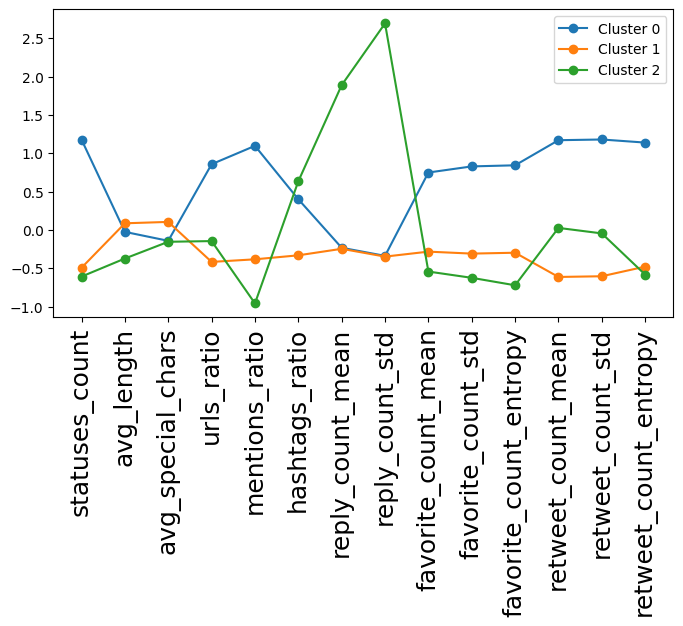

In [20]:
plot_parallel_coordinates_clusters(df_num, kmeans.cluster_centers_, "kmeans")

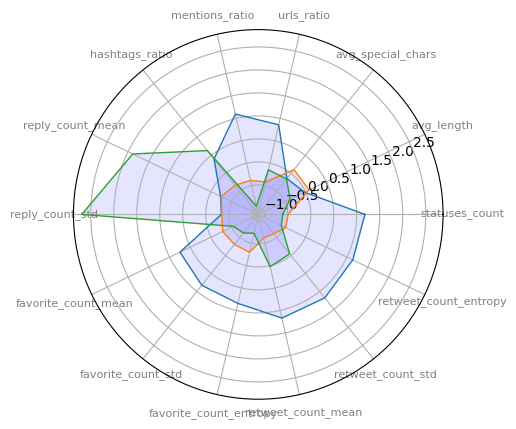

In [21]:
plot_radar_clusters(df_num, kmeans.cluster_centers_, "kmeans")

#### Distribution of CategoricalFeatures per Cluster

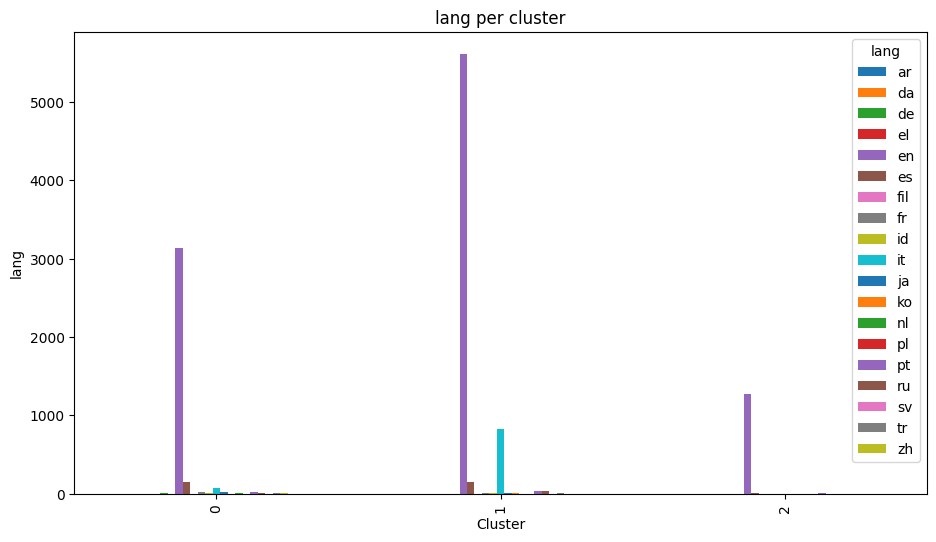

In [22]:
categorical_hist_clusters(df_cat, kmeans.labels_, "lang", "kmeans")

Plot the distribution of bot and non-bot user per cluster, we can see that each cluster have a majority of one of the two classes, this is a simptom of the goodness of the cluster method, and the utility of the selected indicator choosen to describe an user profile.

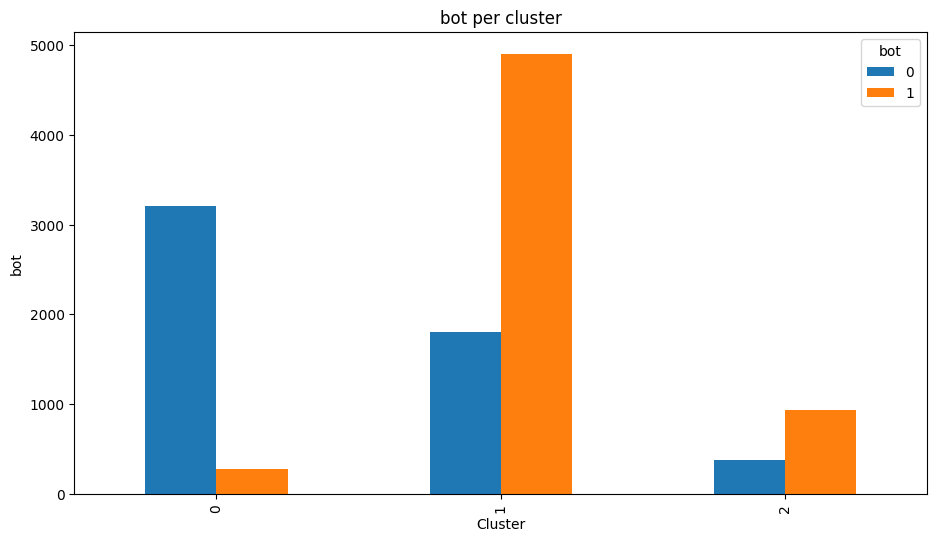

In [23]:
categorical_hist_clusters(df_cat, kmeans.labels_, "bot", "kmeans")

compute the entropy of the feature bot in each cluster

In [24]:
entropy_clusters(df_cat, kmeans.labels_, "bot")

labels
0    0.280668
1    0.582412
2    0.600755
Name: bot, dtype: float64

Plot of the **created_at** feature (grouped by year) of the user in each cluster

0
3491


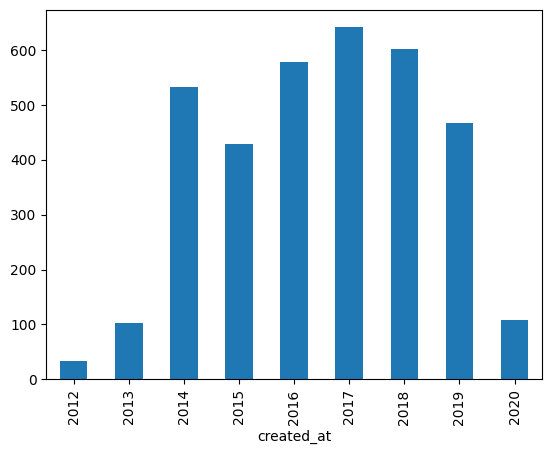

1
6710


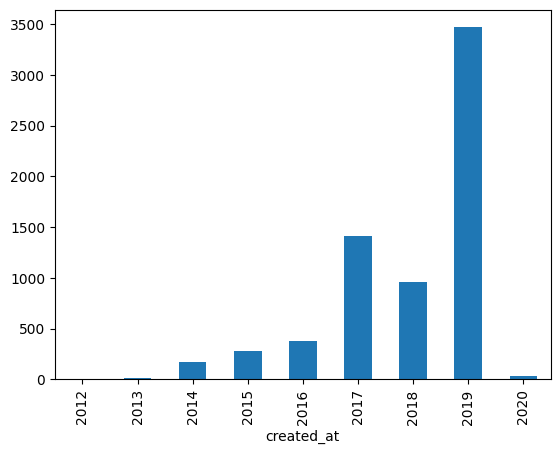

2
1307


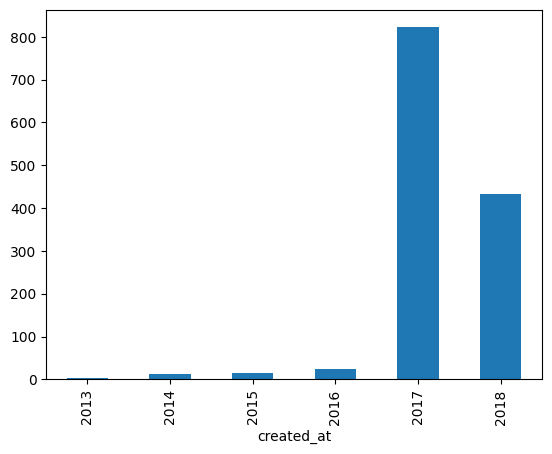

In [25]:
plot_date_feature_clusters(df_cat, kmeans.labels_, selected_k)

#### Distribution of Numerical Features per Cluster

We will plot the distribution of the variables in the original space, plotting the boxplots and histogram of each numerical feature for each discovered cluster.

We can see that the distribution of the features are different for each cluster, the cluster with less entropy of feature **bot** have less sparsity of the feature **Statuses Count**.

The second cluster (majority in BOT) has less sparsity in **retweet count mean** and **retweet count std**. In this case the better distributions are due to the low number of samples in the second cluster.

The third one (mayority in BOT) has high number of skewed features.

cluster 0:


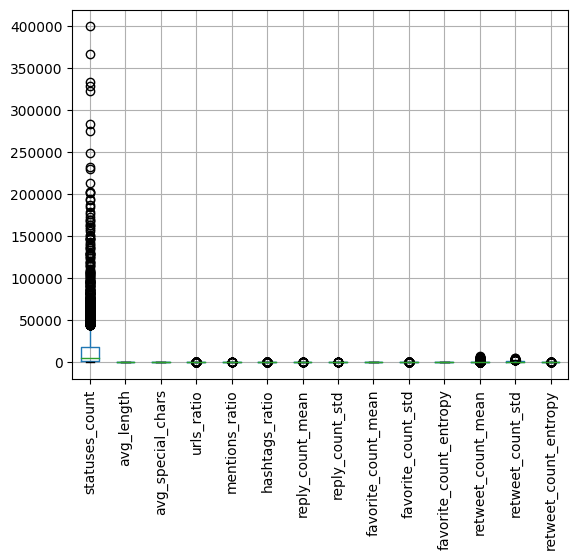

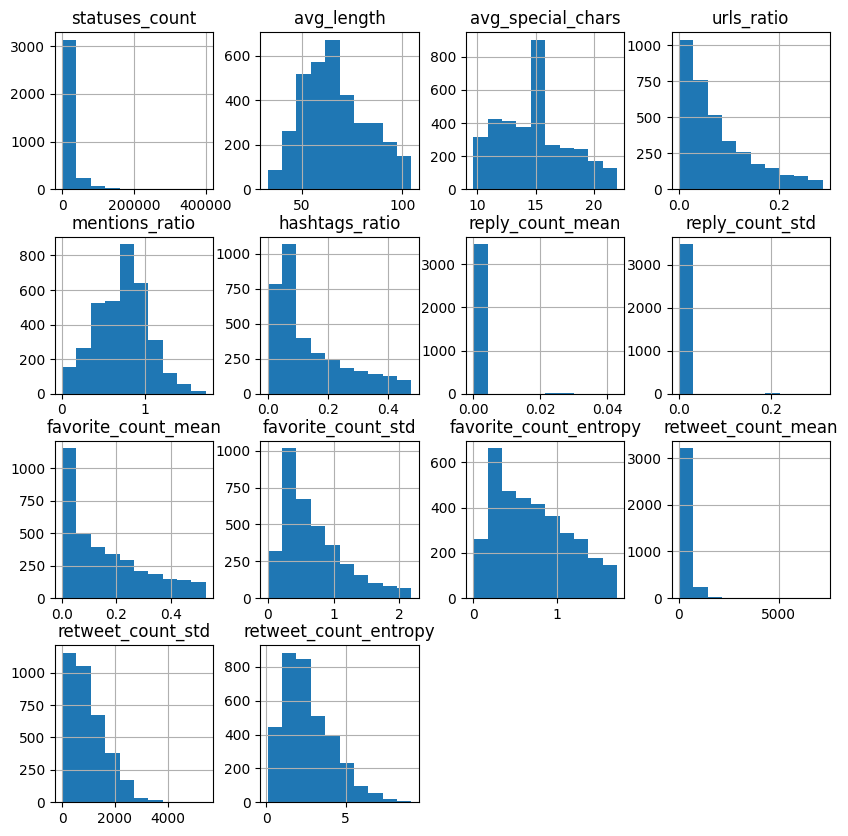

cluster 1:


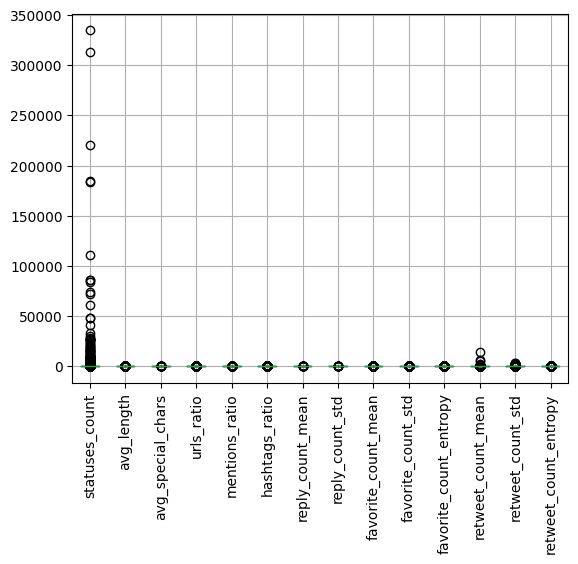

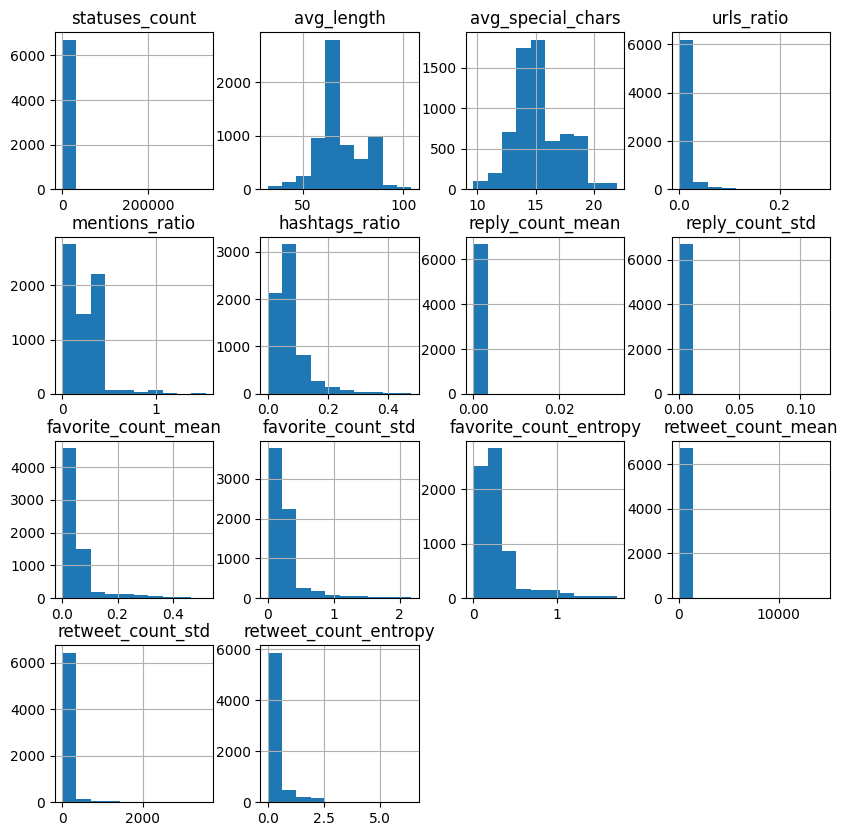

cluster 2:


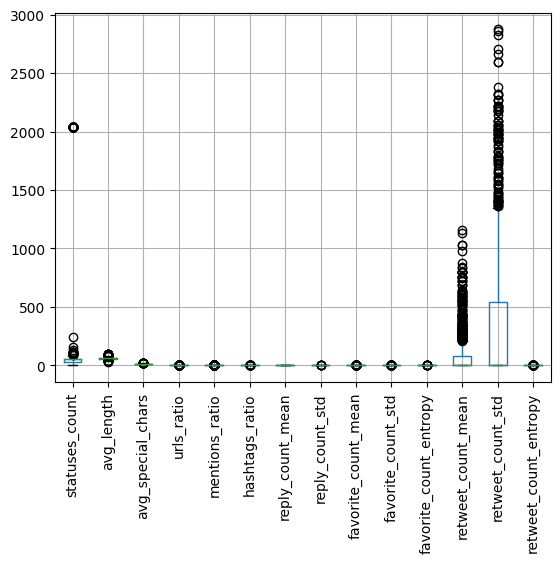

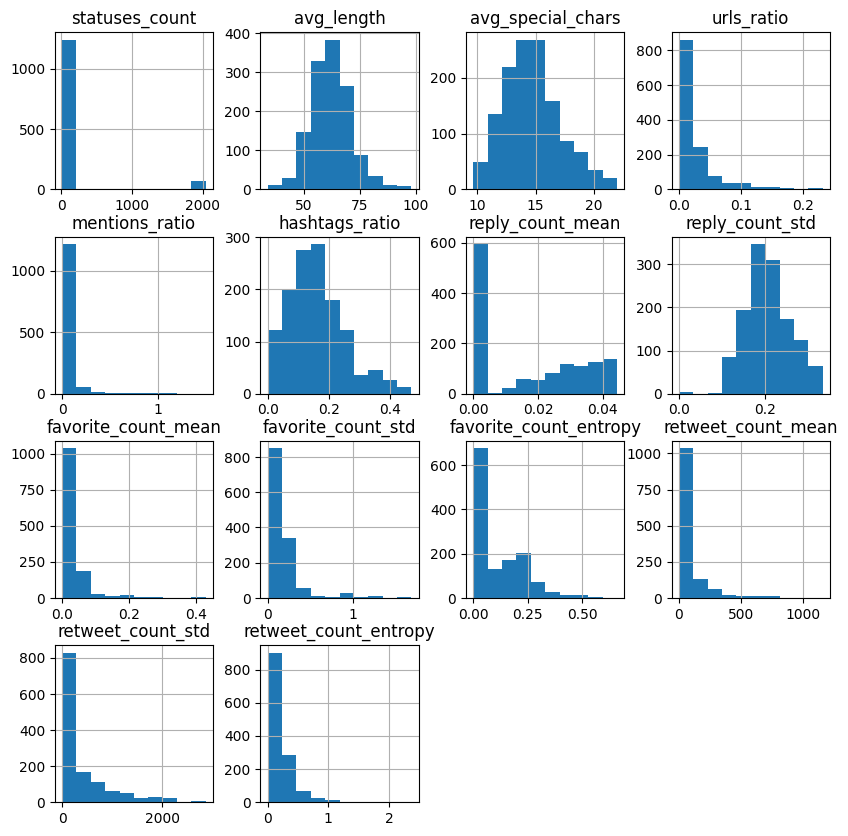

In [26]:
plot_numerical_features_clusters(df_num, kmeans.labels_, selected_k)

### Report statistics of each cluster

First print out the std and mean of all the dataset

In [27]:
df_num.describe().loc[["std", "mean"]]

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
std,18496.606420,12.755296,2.454106,0.053379,0.343735,0.093837,0.007796,0.068508,0.109623,0.408441,0.390787,329.248000,626.207734,1.412183
mean,5148.794751,67.100135,15.045892,0.031045,0.347537,0.101921,0.001967,0.023941,0.084282,0.365569,0.385430,98.347409,361.956697,1.011612


Then print out the std and mean of data grouped in clusters

In [28]:
for i in range(selected_k):
    print()
    print(f"cluster {i}:")
    i_samples = kmeans.labels_==i
    print(df_num[i_samples].describe().loc[["std", "mean"]])
    print()
    print()


cluster 0:
      statuses_count  avg_length  avg_special_chars  urls_ratio  \
std     29186.387362   16.006391           2.962383    0.068117   
mean    15785.755371   66.770785          14.791114    0.075962   

      mentions_ratio  hashtags_ratio  reply_count_mean  reply_count_std  \
std         0.308509        0.120188          0.001993         0.013549   
mean        0.727718        0.139949          0.000153         0.000859   

      favorite_count_mean  favorite_count_std  favorite_count_entropy  \
std              0.139640            0.475615                0.437469   
mean             0.164731            0.682299                0.714742   

      retweet_count_mean  retweet_count_std  retweet_count_entropy  
std           464.274668         723.383019               1.555286  
mean          268.580018         971.598375               2.620140  



cluster 1:
      statuses_count  avg_length  avg_special_chars  urls_ratio  \
std      7686.992287   11.146228           2.126142 

### Scatter Plots

Plotting the scatter plot of each pair of numerical features, coloring out the points with respect the cluster number of each sample

statuses_count - avg_length


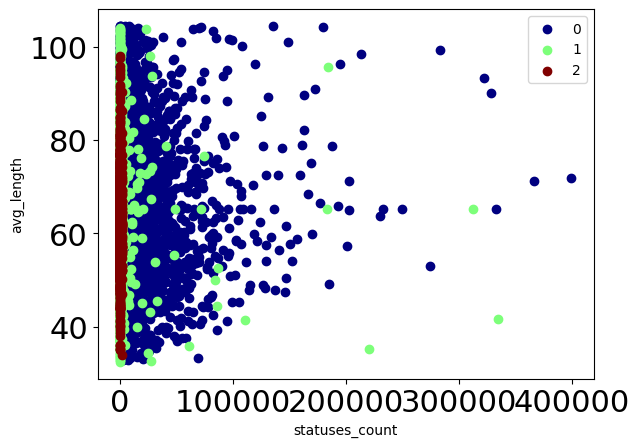

statuses_count - avg_special_chars


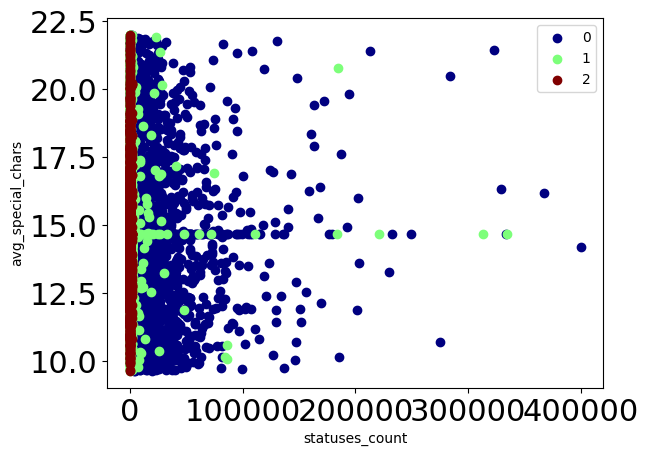

statuses_count - urls_ratio


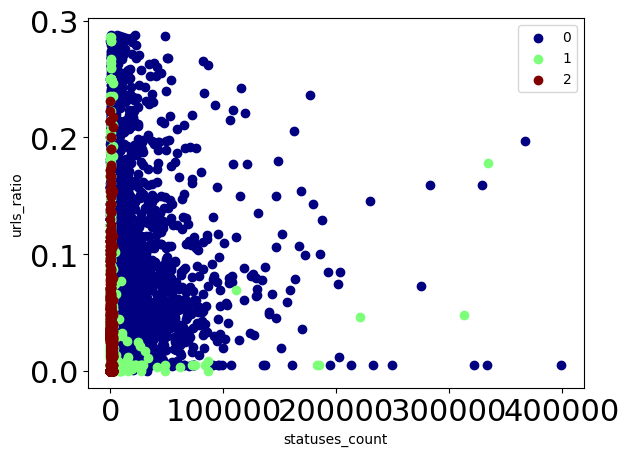

statuses_count - mentions_ratio


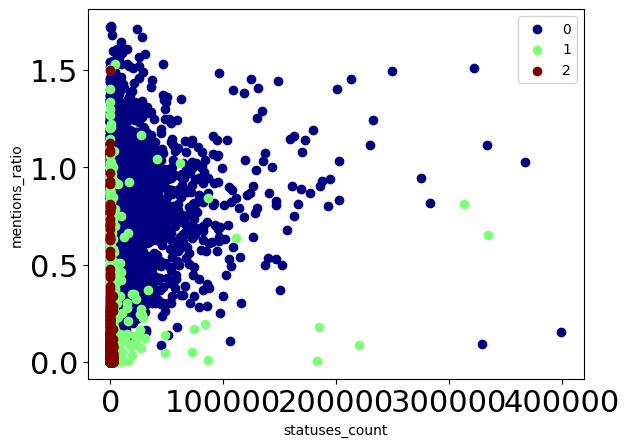

statuses_count - hashtags_ratio


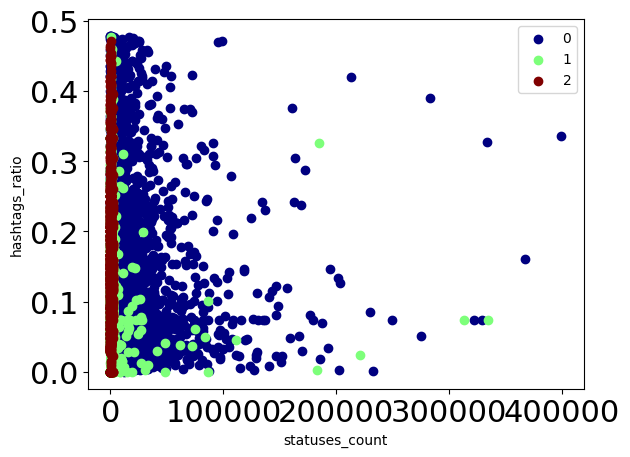

statuses_count - reply_count_mean


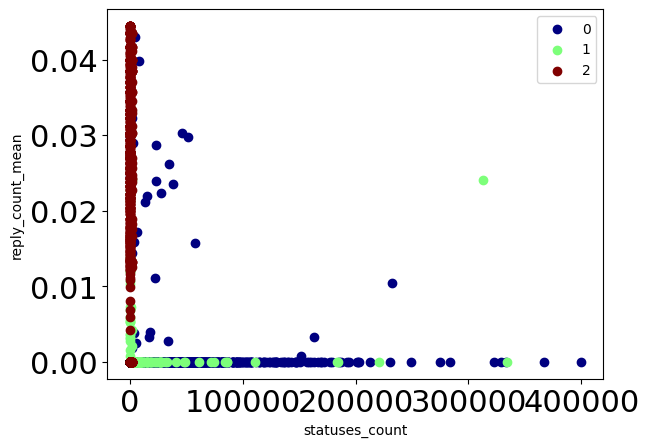

statuses_count - reply_count_std


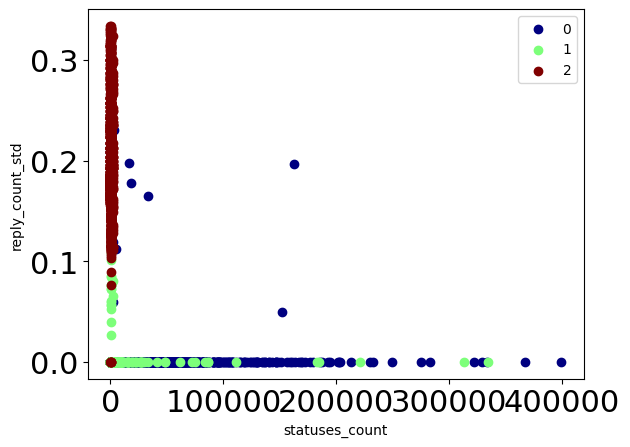

statuses_count - favorite_count_mean


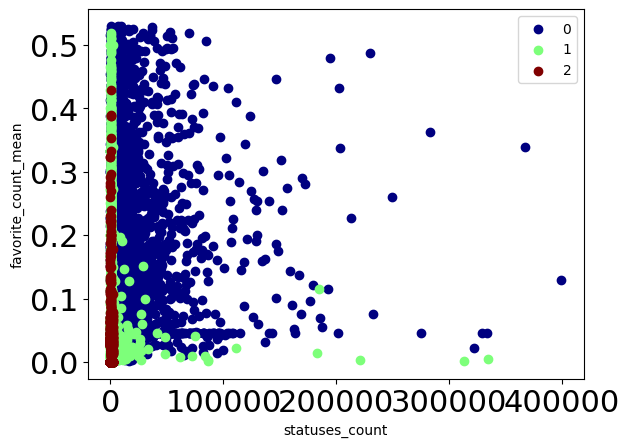

statuses_count - favorite_count_std


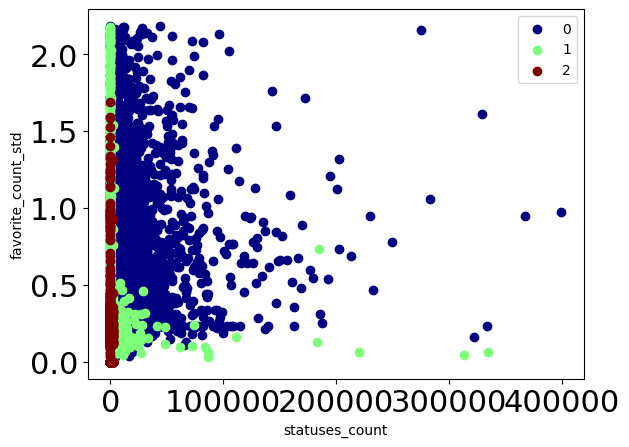

statuses_count - favorite_count_entropy


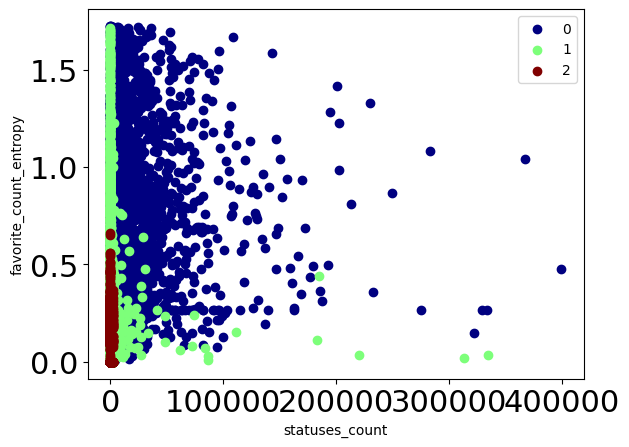

statuses_count - retweet_count_mean


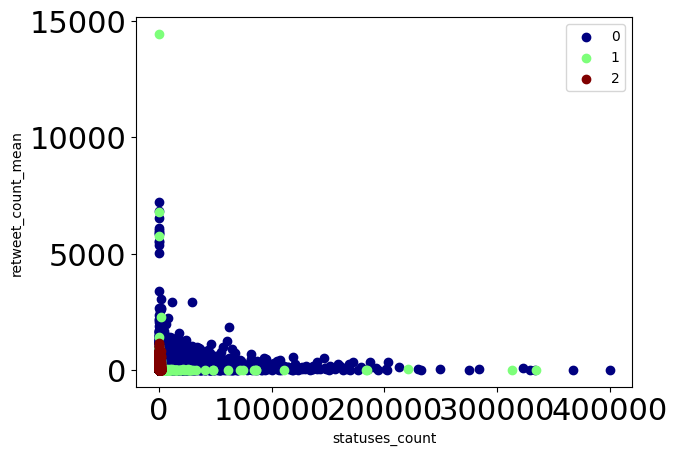

statuses_count - retweet_count_std


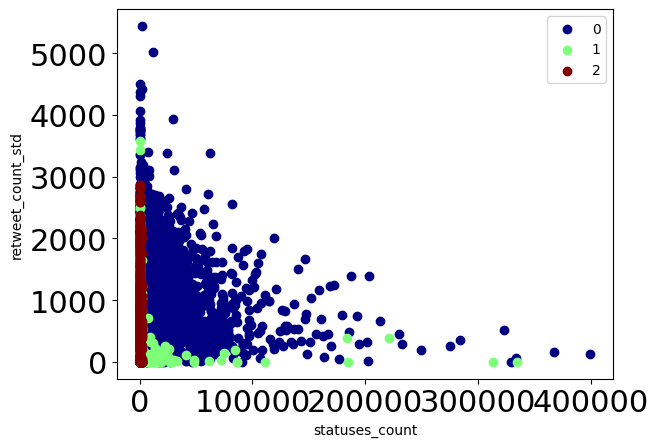

statuses_count - retweet_count_entropy


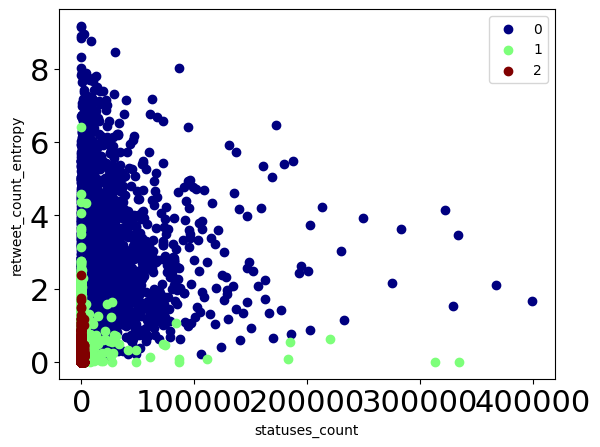

avg_length - avg_special_chars


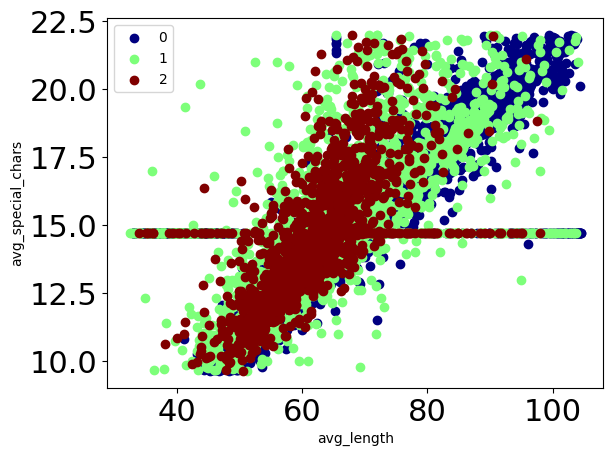

avg_length - urls_ratio


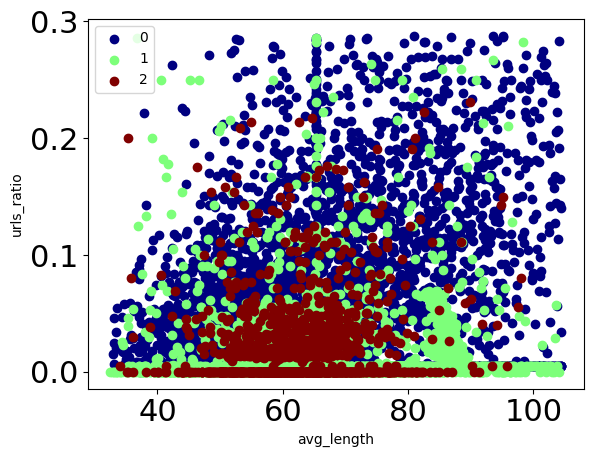

avg_length - mentions_ratio


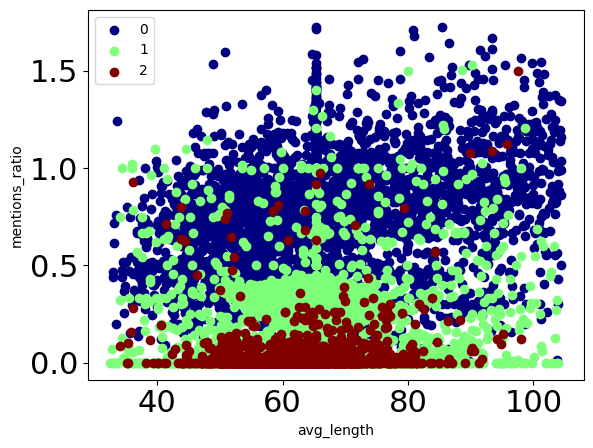

avg_length - hashtags_ratio


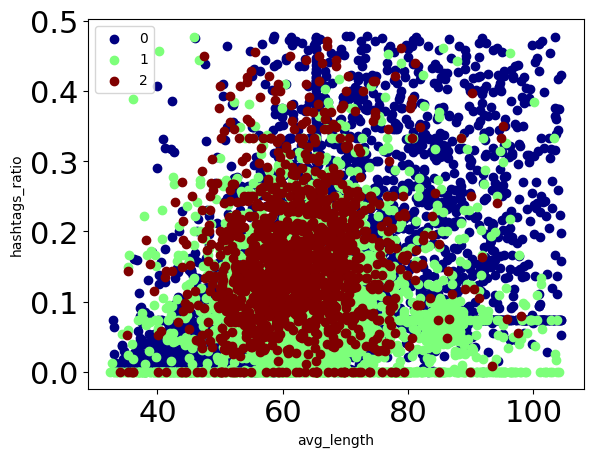

avg_length - reply_count_mean


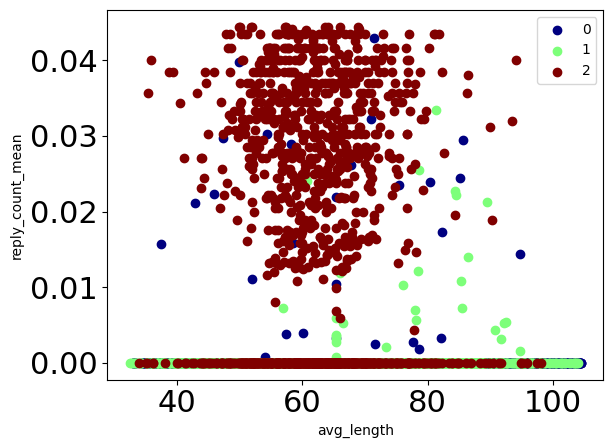

avg_length - reply_count_std


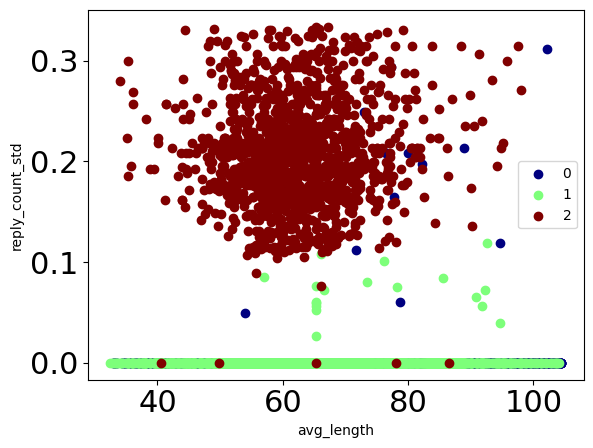

avg_length - favorite_count_mean


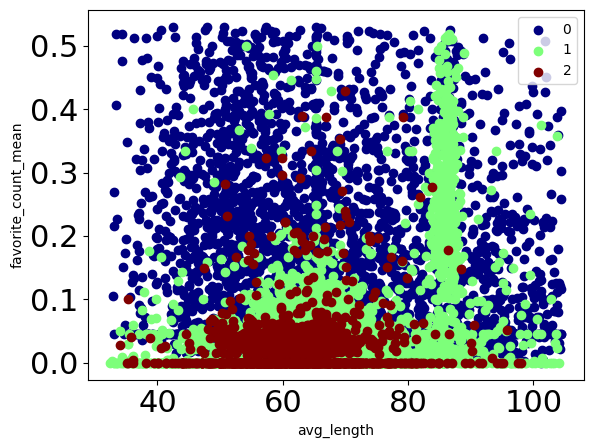

avg_length - favorite_count_std


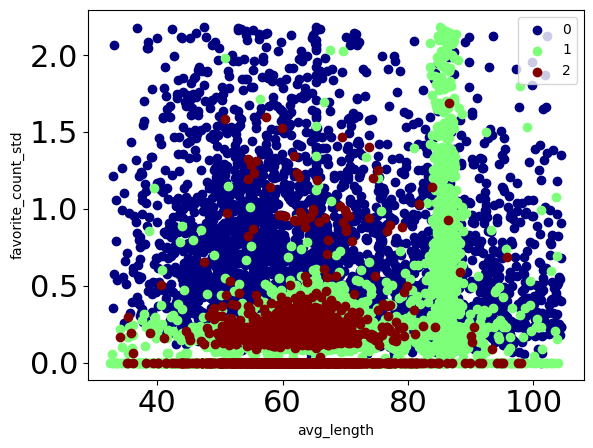

avg_length - favorite_count_entropy


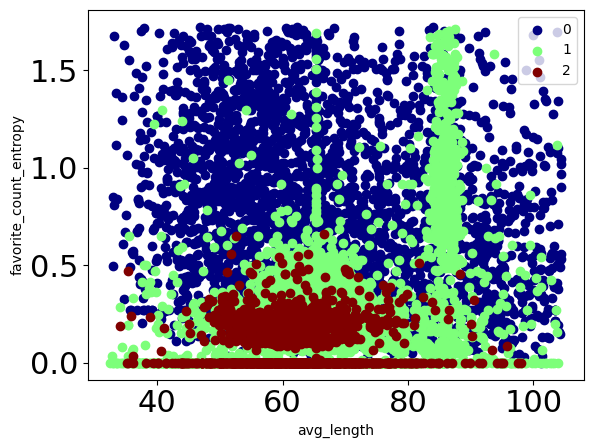

avg_length - retweet_count_mean


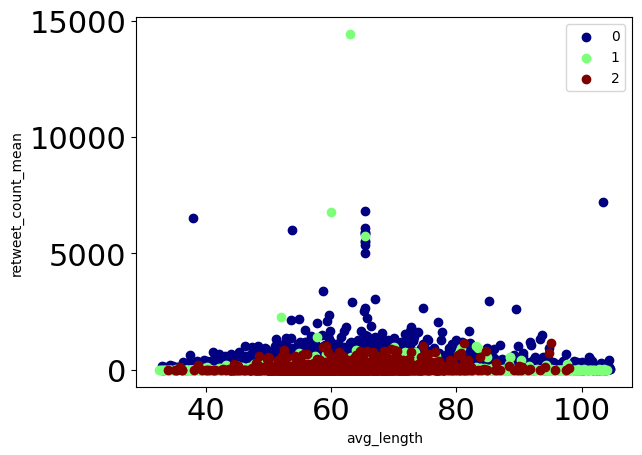

avg_length - retweet_count_std


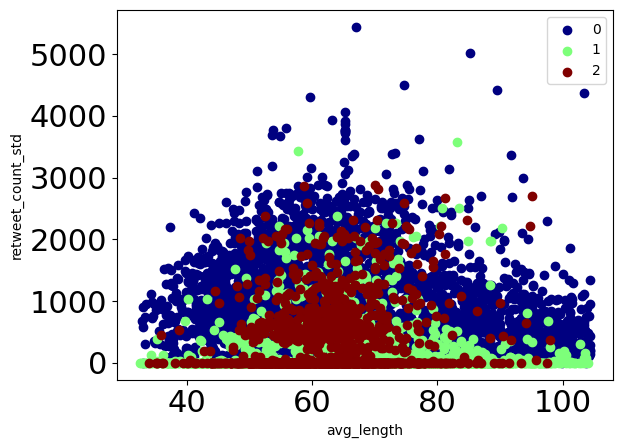

avg_length - retweet_count_entropy


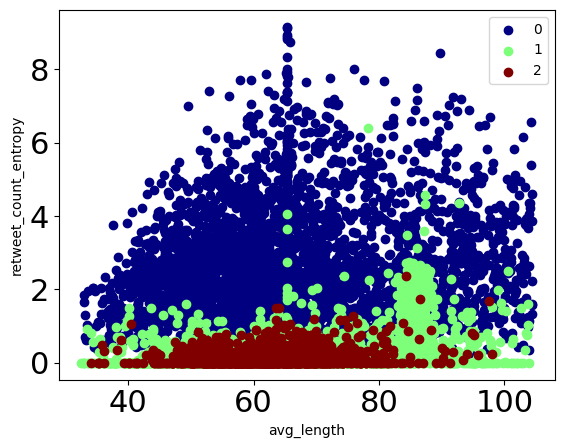

avg_special_chars - urls_ratio


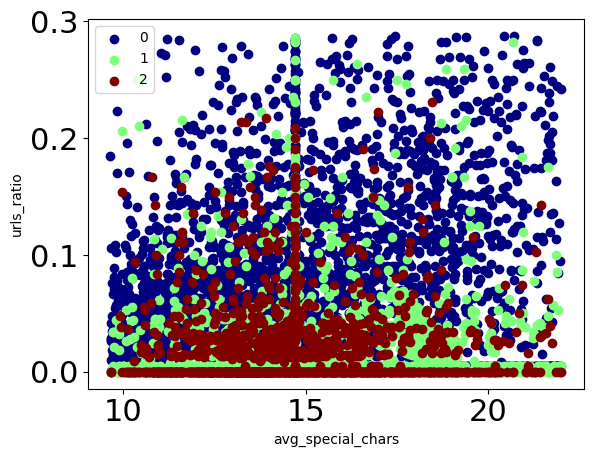

avg_special_chars - mentions_ratio


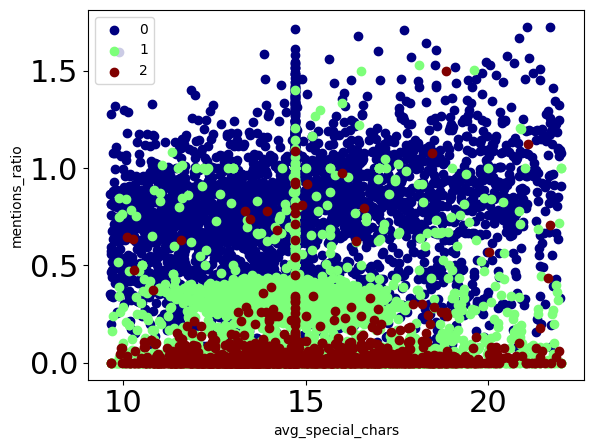

avg_special_chars - hashtags_ratio


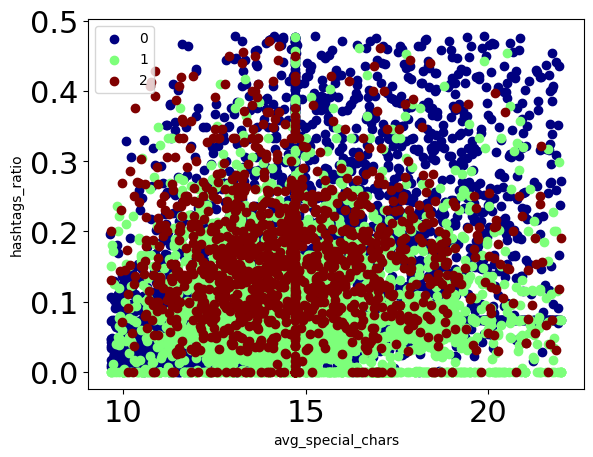

avg_special_chars - reply_count_mean


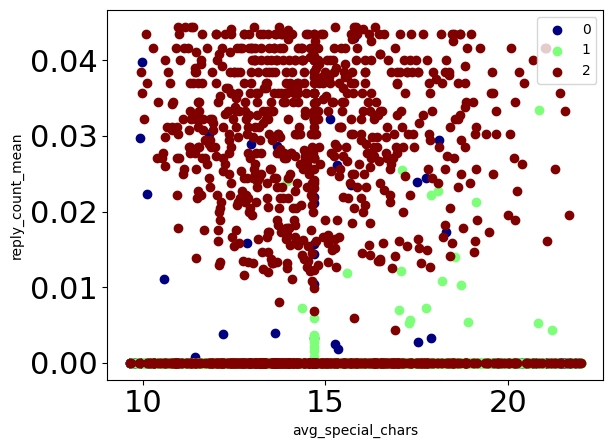

avg_special_chars - reply_count_std


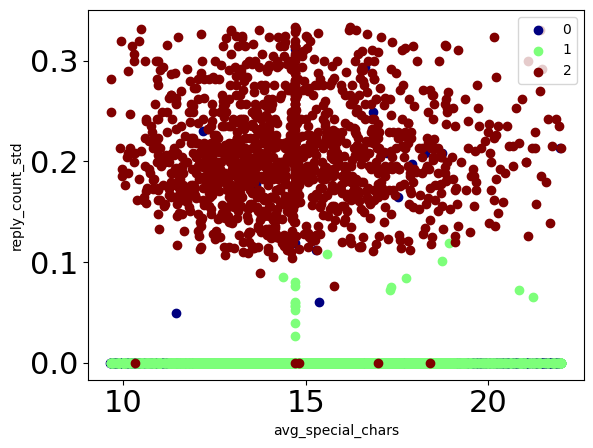

avg_special_chars - favorite_count_mean


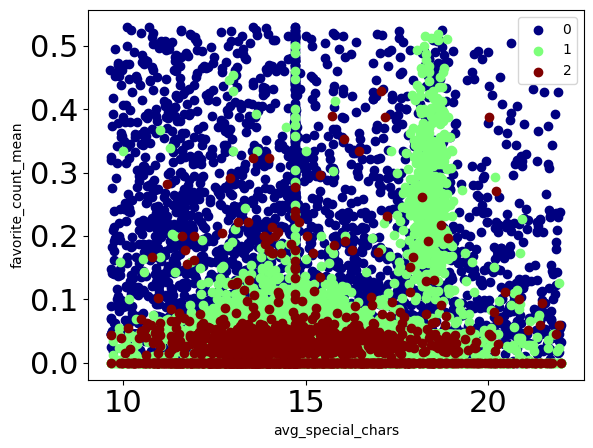

avg_special_chars - favorite_count_std


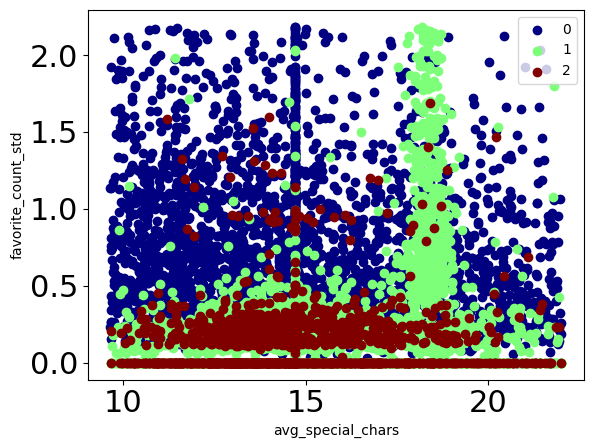

avg_special_chars - favorite_count_entropy


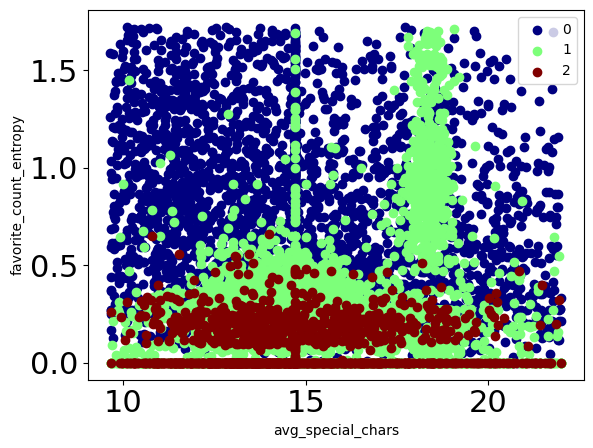

avg_special_chars - retweet_count_mean


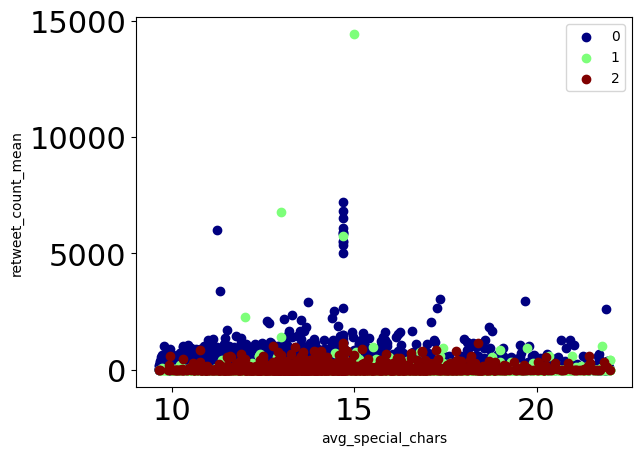

avg_special_chars - retweet_count_std


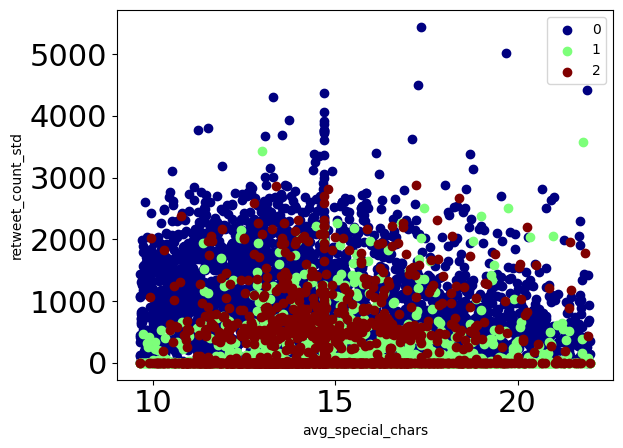

avg_special_chars - retweet_count_entropy


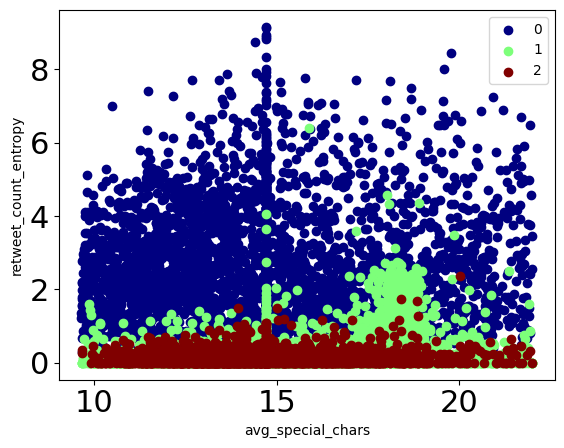

urls_ratio - mentions_ratio


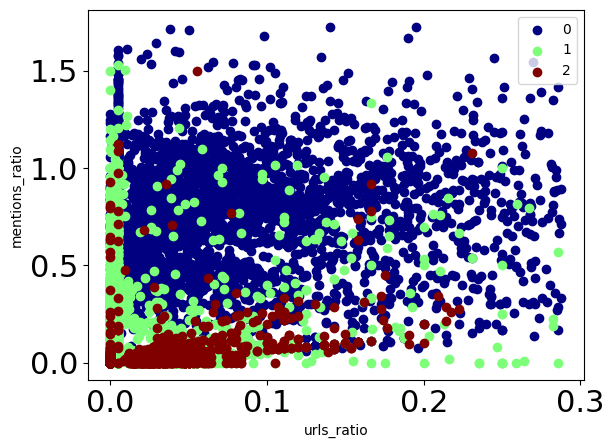

urls_ratio - hashtags_ratio


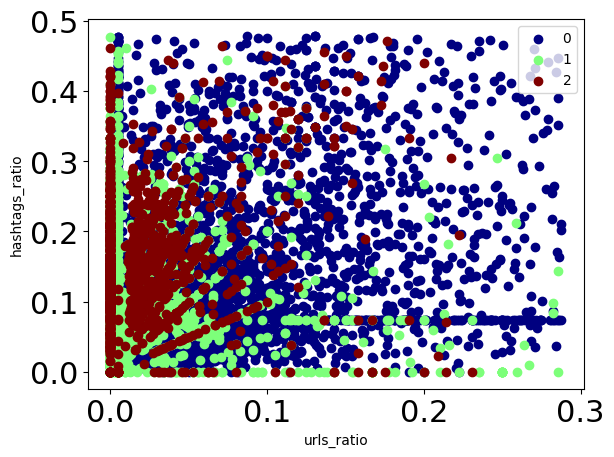

urls_ratio - reply_count_mean


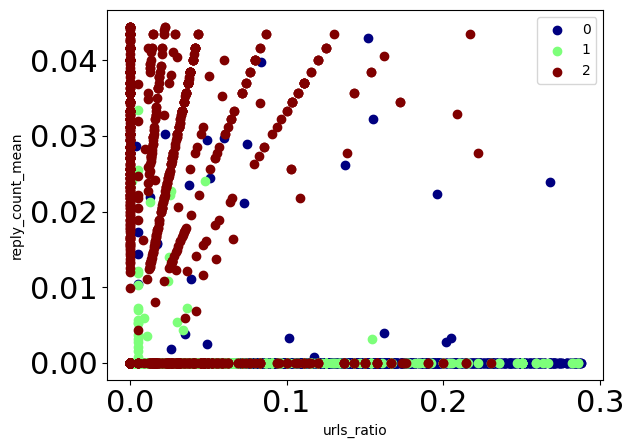

urls_ratio - reply_count_std


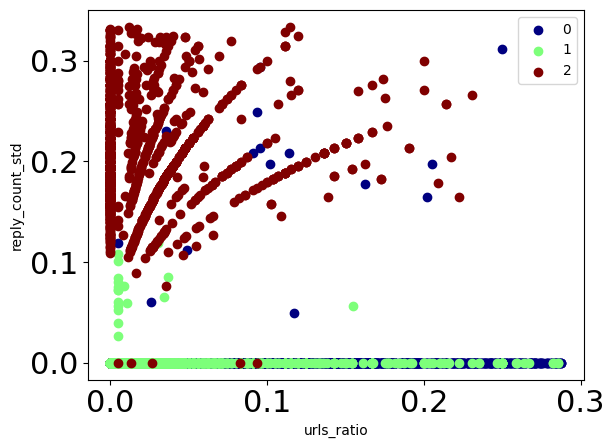

urls_ratio - favorite_count_mean


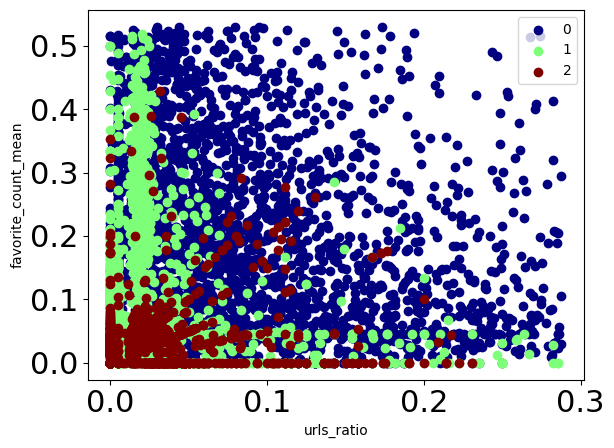

urls_ratio - favorite_count_std


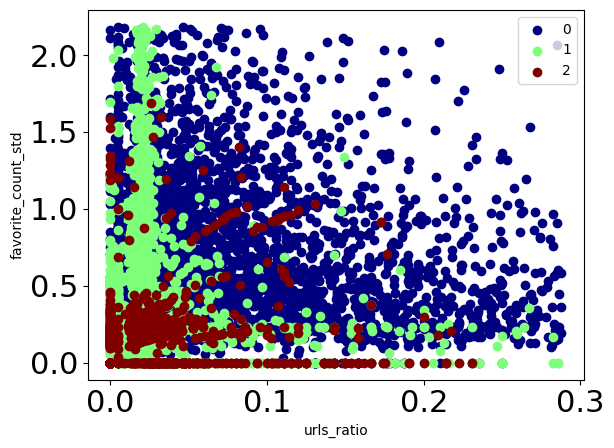

urls_ratio - favorite_count_entropy


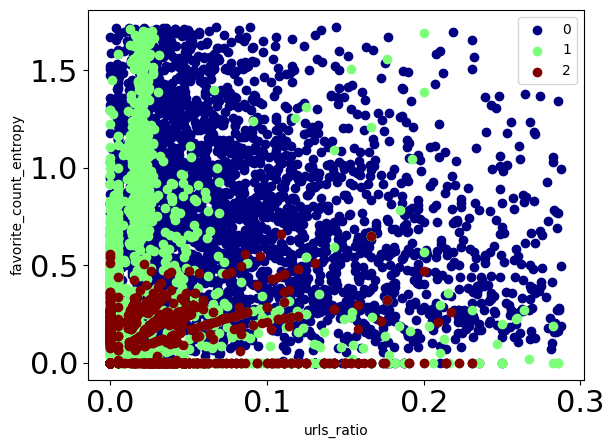

urls_ratio - retweet_count_mean


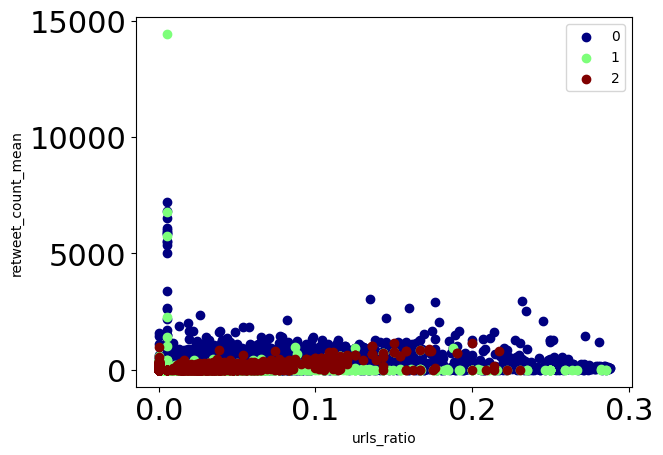

urls_ratio - retweet_count_std


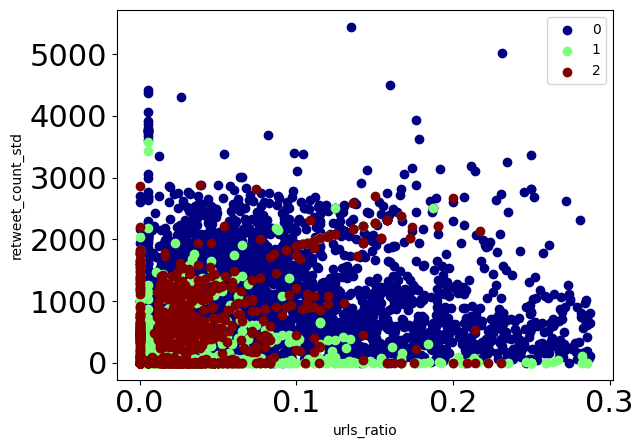

urls_ratio - retweet_count_entropy


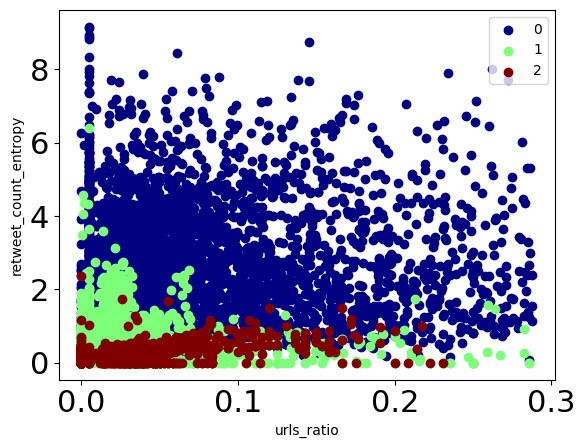

mentions_ratio - hashtags_ratio


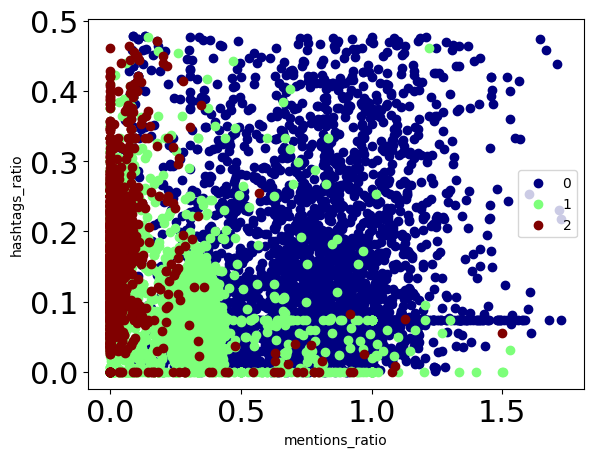

mentions_ratio - reply_count_mean


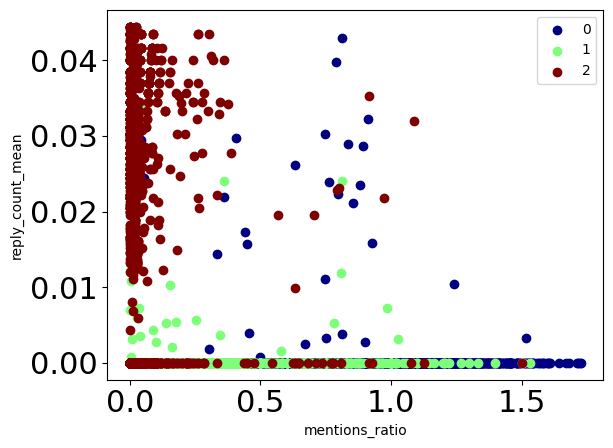

mentions_ratio - reply_count_std


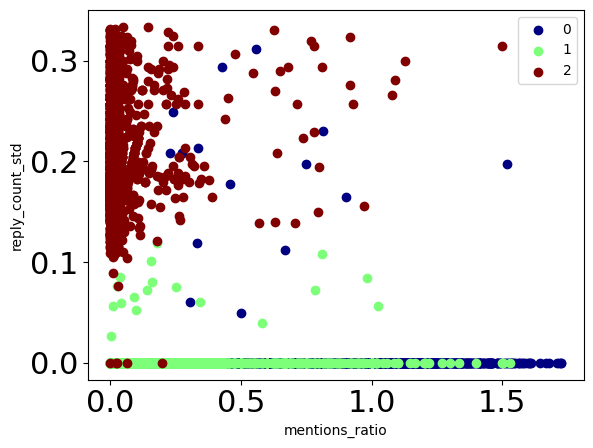

mentions_ratio - favorite_count_mean


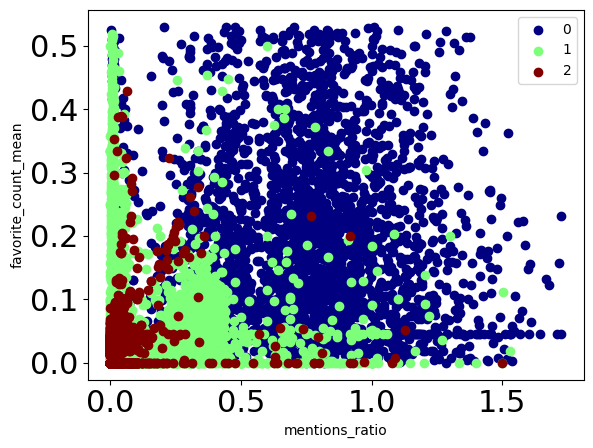

mentions_ratio - favorite_count_std


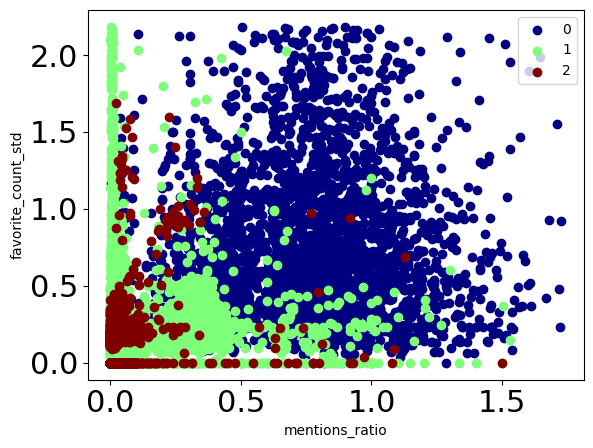

mentions_ratio - favorite_count_entropy


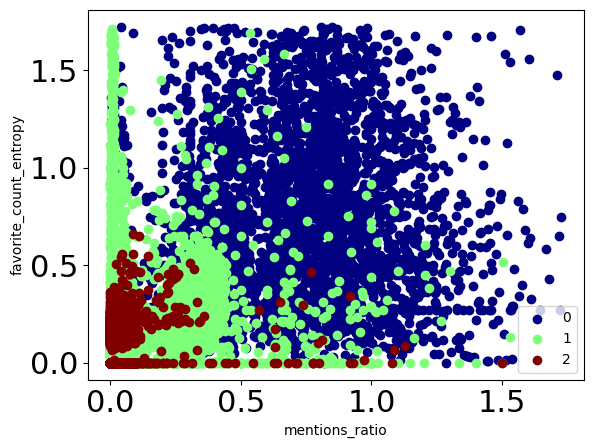

mentions_ratio - retweet_count_mean


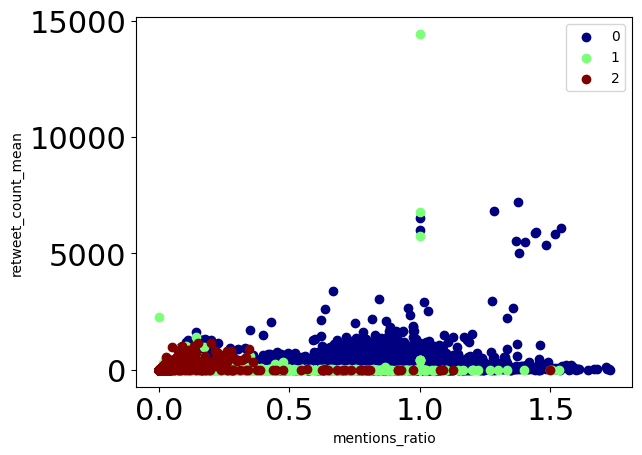

mentions_ratio - retweet_count_std


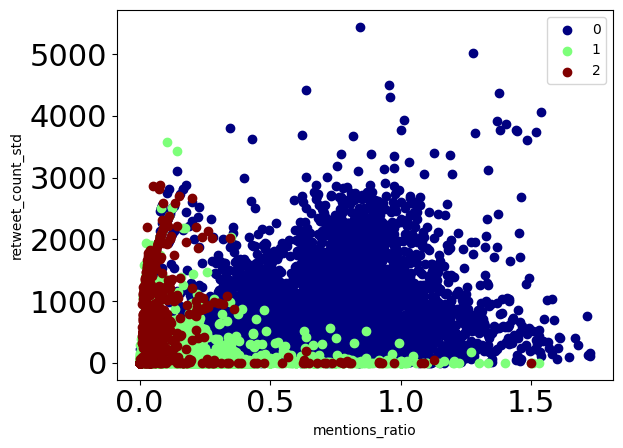

mentions_ratio - retweet_count_entropy


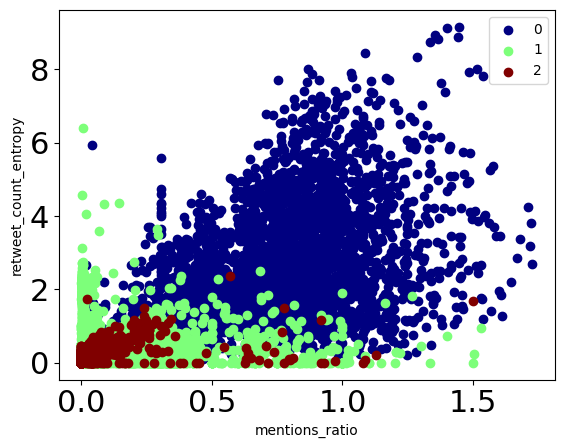

hashtags_ratio - reply_count_mean


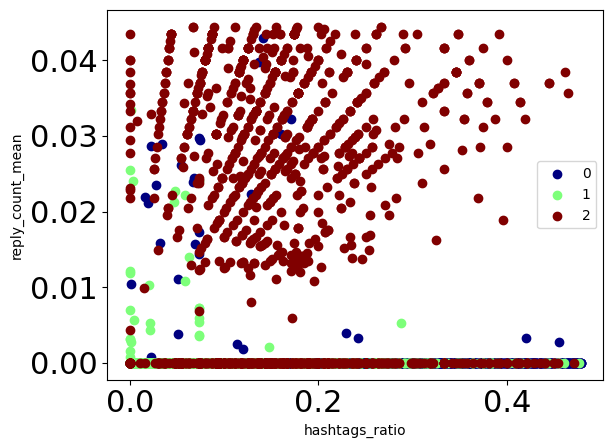

hashtags_ratio - reply_count_std


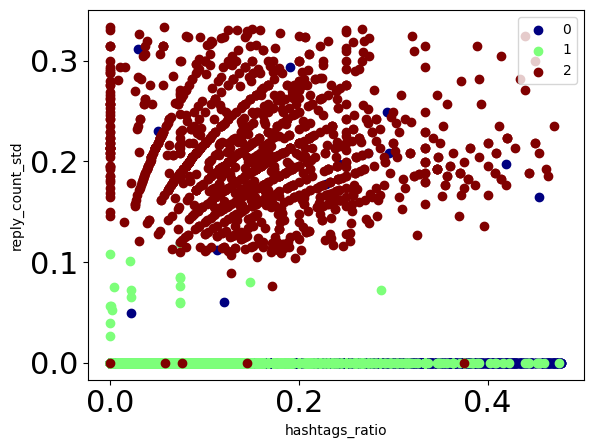

hashtags_ratio - favorite_count_mean


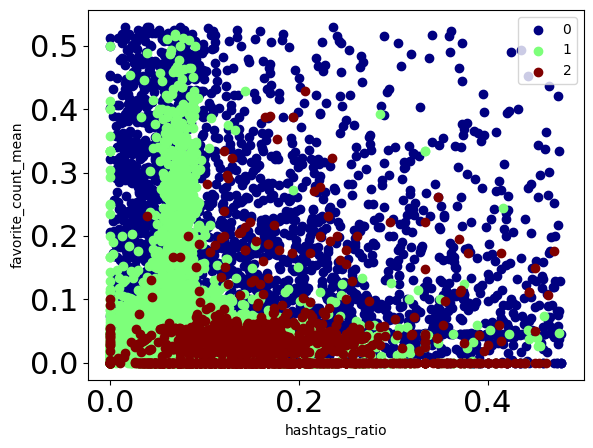

hashtags_ratio - favorite_count_std


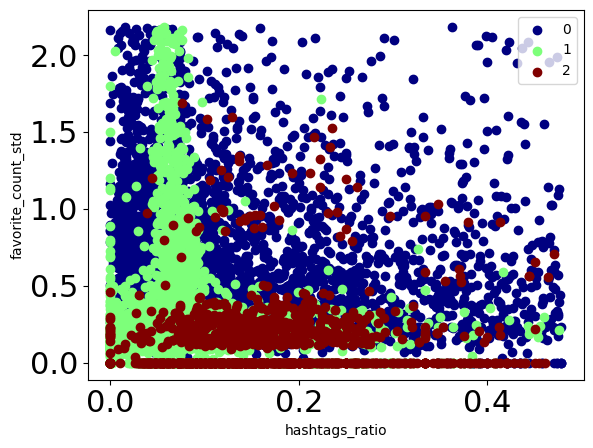

hashtags_ratio - favorite_count_entropy


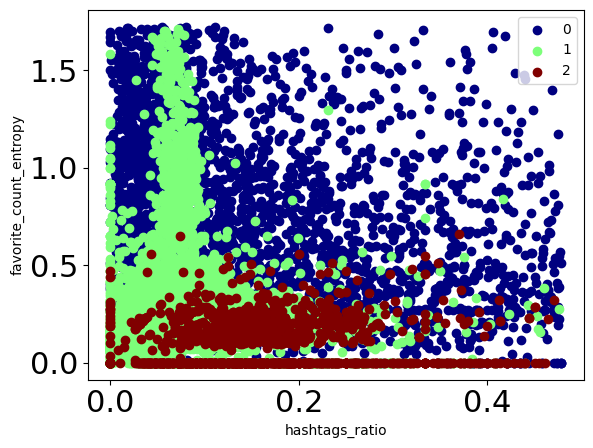

hashtags_ratio - retweet_count_mean


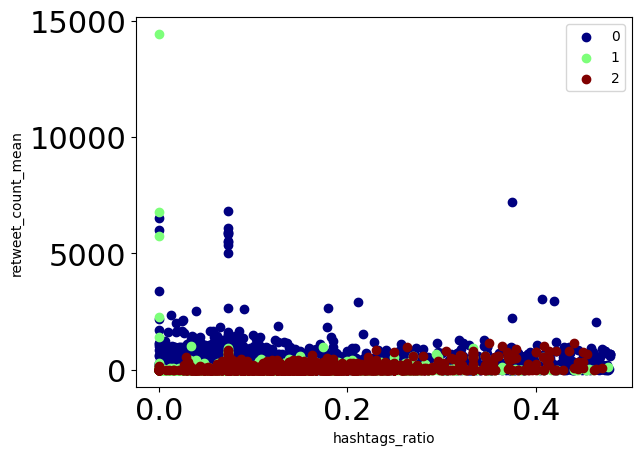

hashtags_ratio - retweet_count_std


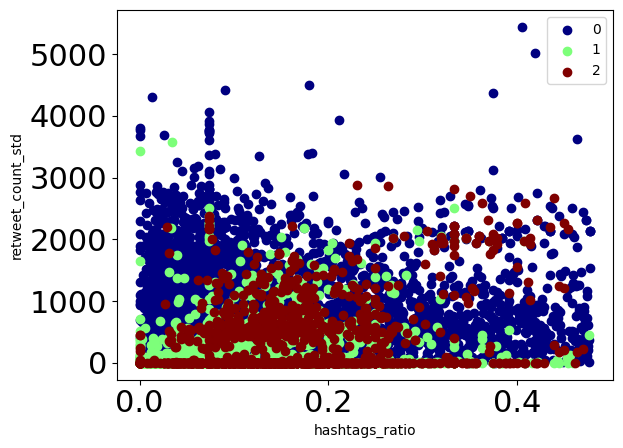

hashtags_ratio - retweet_count_entropy


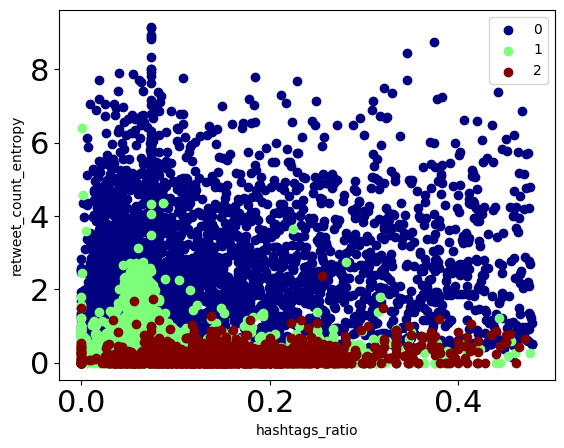

reply_count_mean - reply_count_std


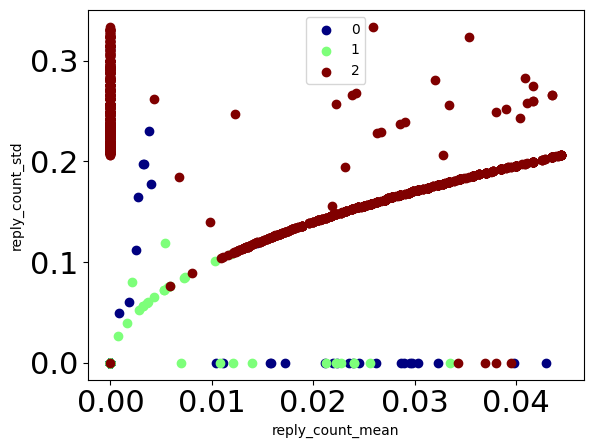

reply_count_mean - favorite_count_mean


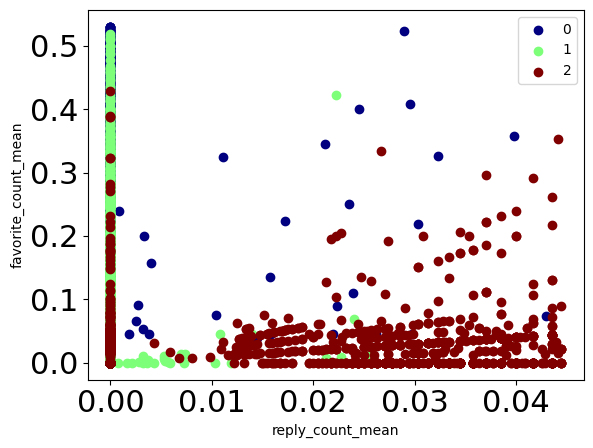

reply_count_mean - favorite_count_std


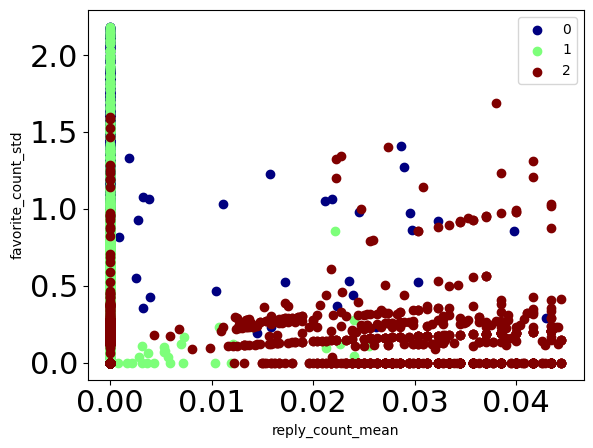

reply_count_mean - favorite_count_entropy


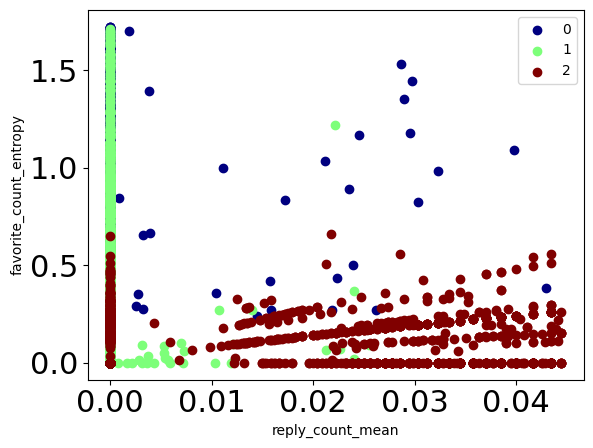

reply_count_mean - retweet_count_mean


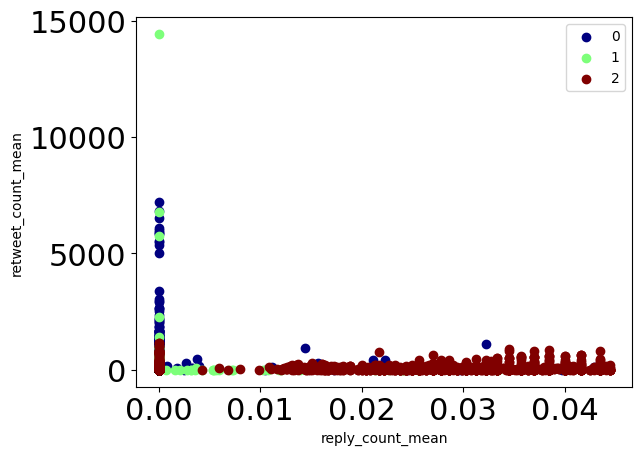

reply_count_mean - retweet_count_std


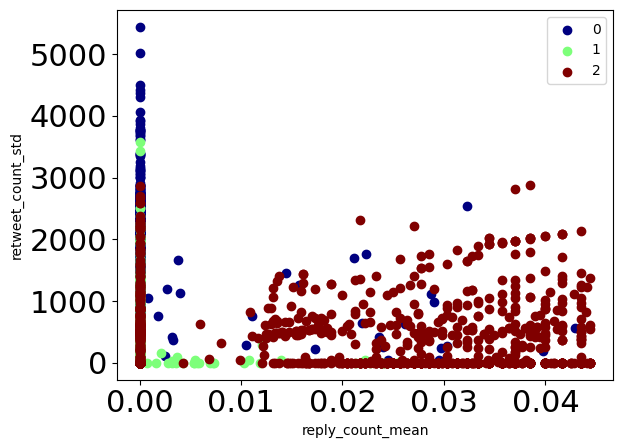

reply_count_mean - retweet_count_entropy


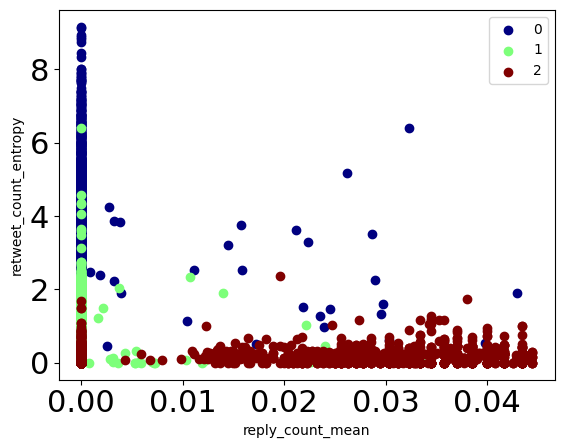

reply_count_std - favorite_count_mean


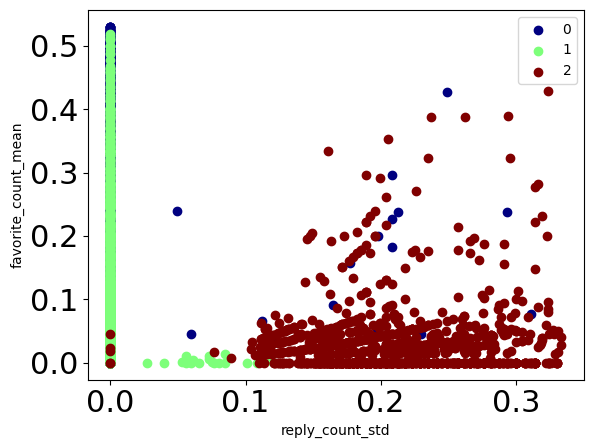

reply_count_std - favorite_count_std


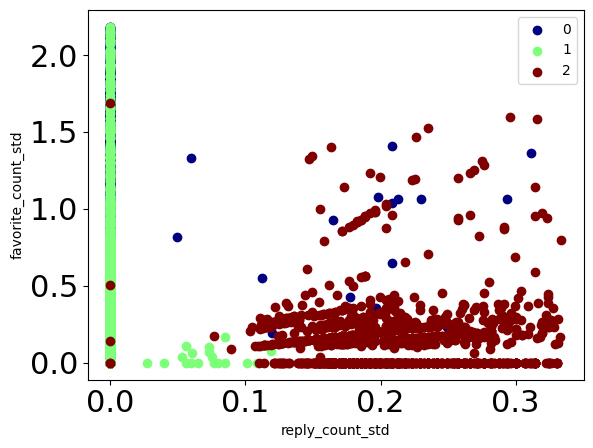

reply_count_std - favorite_count_entropy


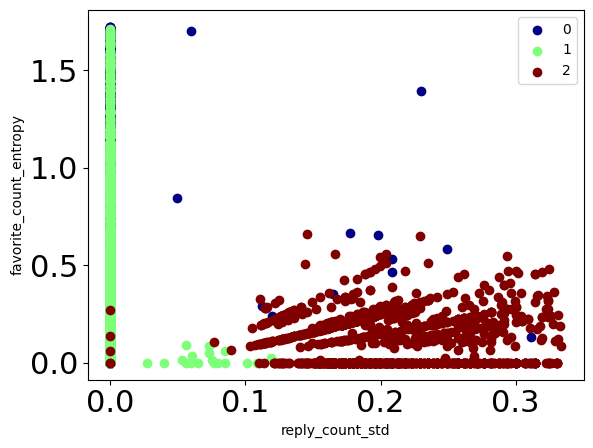

reply_count_std - retweet_count_mean


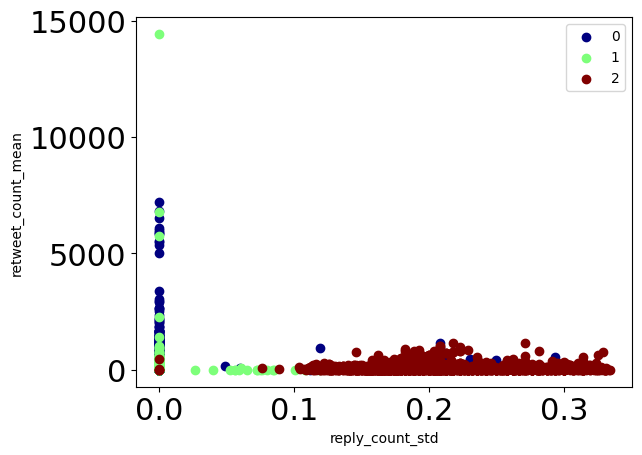

reply_count_std - retweet_count_std


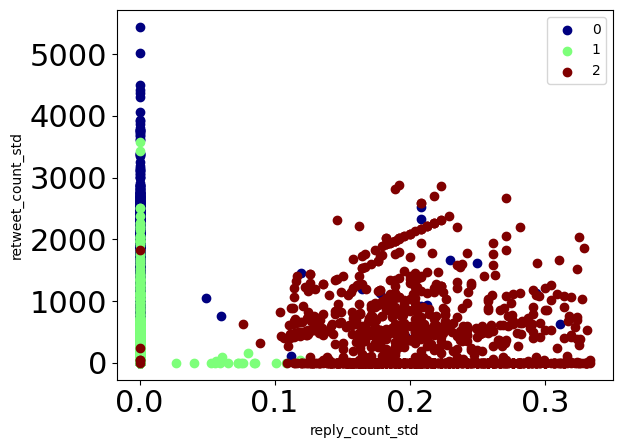

reply_count_std - retweet_count_entropy


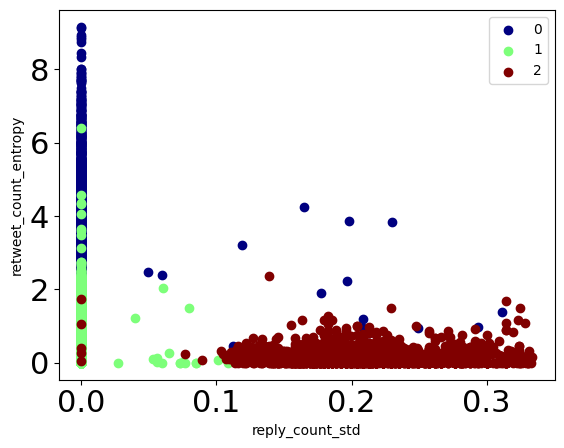

favorite_count_mean - favorite_count_std


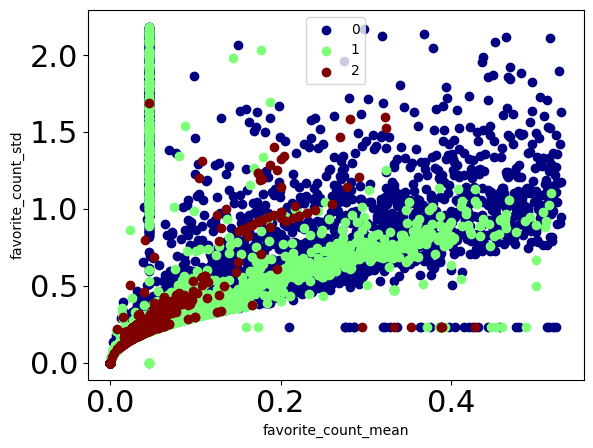

favorite_count_mean - favorite_count_entropy


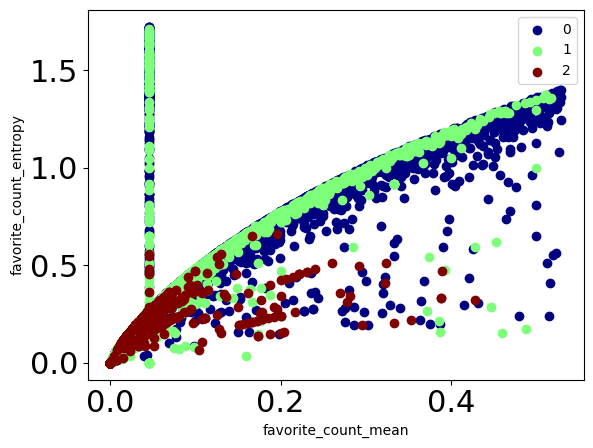

favorite_count_mean - retweet_count_mean


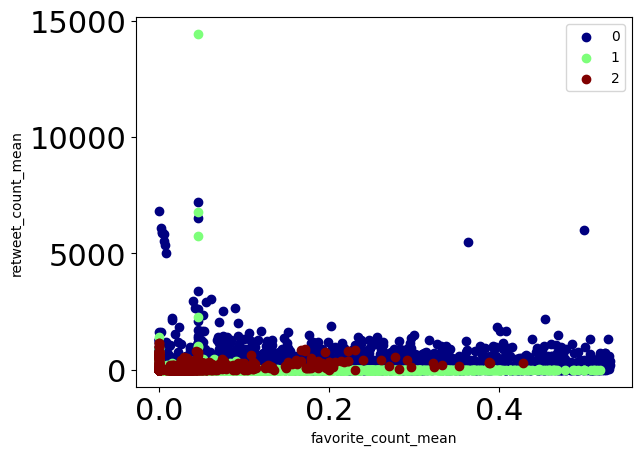

favorite_count_mean - retweet_count_std


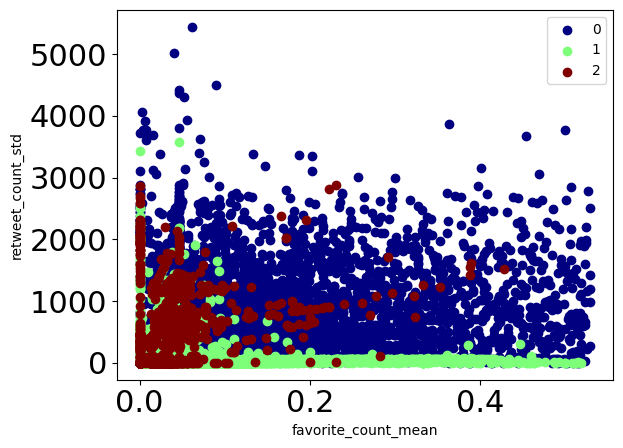

favorite_count_mean - retweet_count_entropy


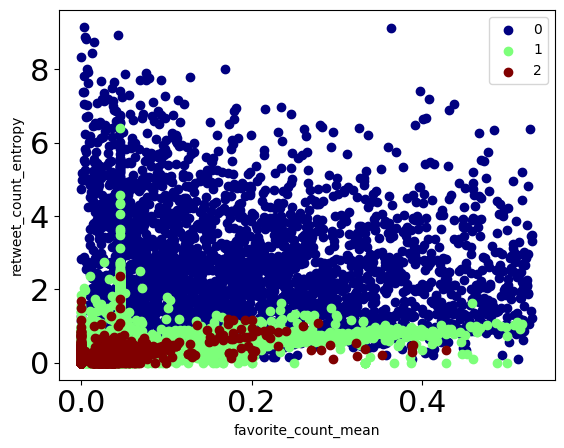

favorite_count_std - favorite_count_entropy


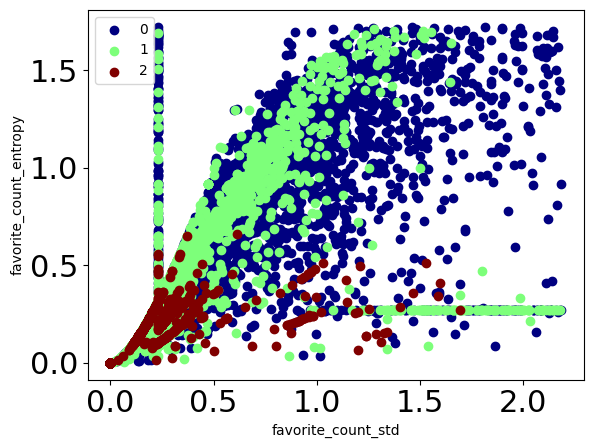

favorite_count_std - retweet_count_mean


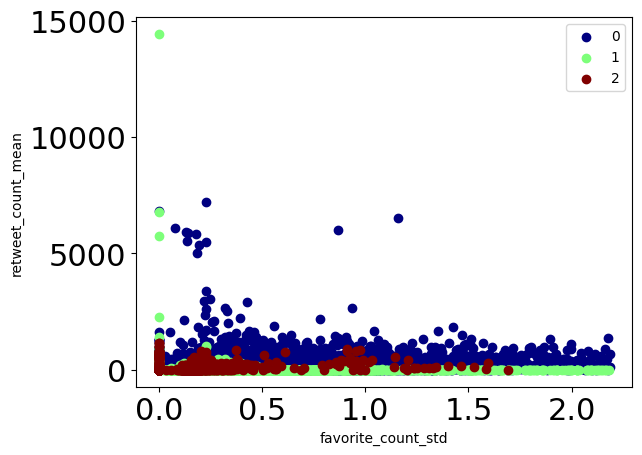

favorite_count_std - retweet_count_std


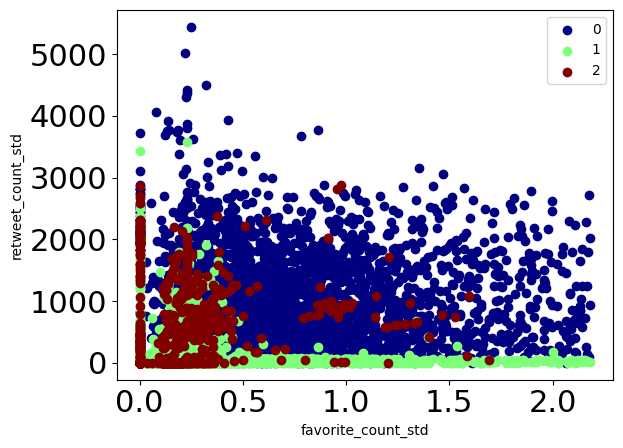

favorite_count_std - retweet_count_entropy


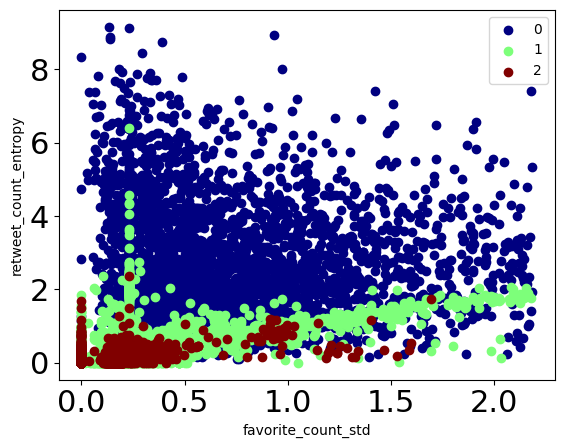

favorite_count_entropy - retweet_count_mean


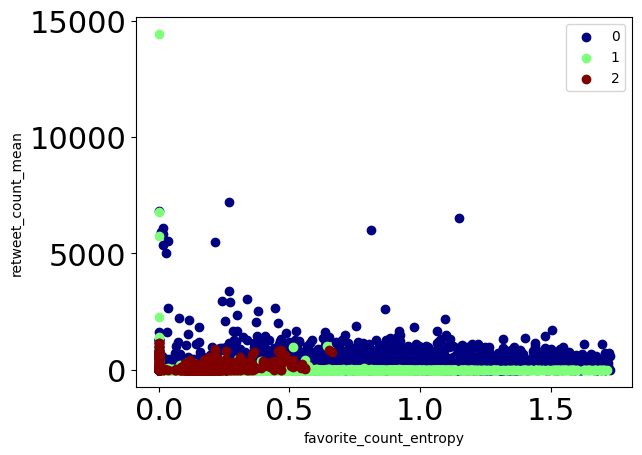

favorite_count_entropy - retweet_count_std


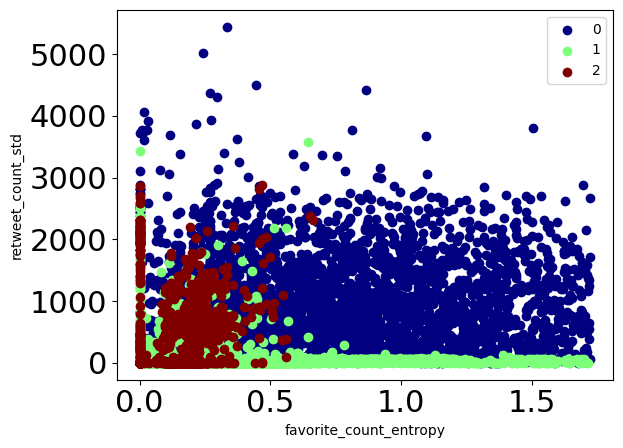

favorite_count_entropy - retweet_count_entropy


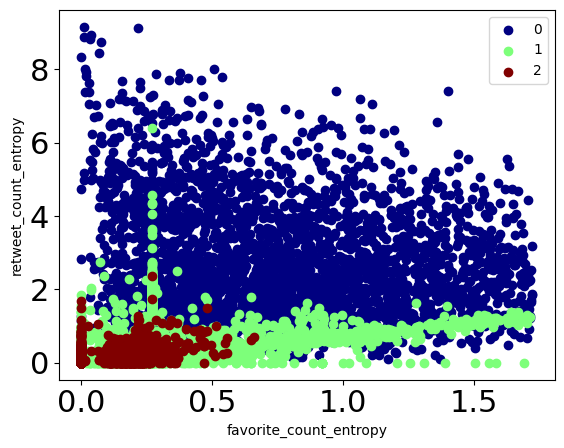

retweet_count_mean - retweet_count_std


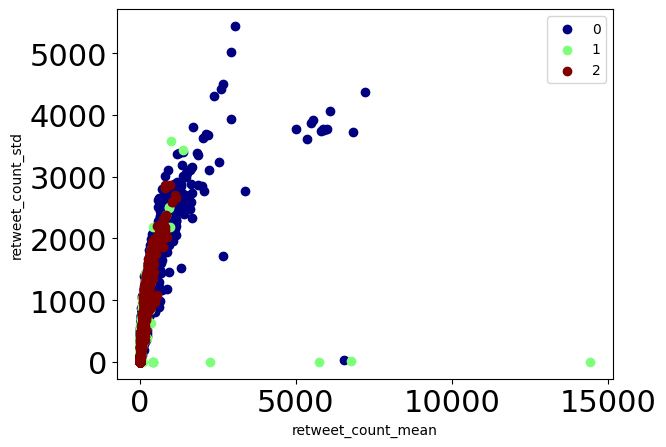

retweet_count_mean - retweet_count_entropy


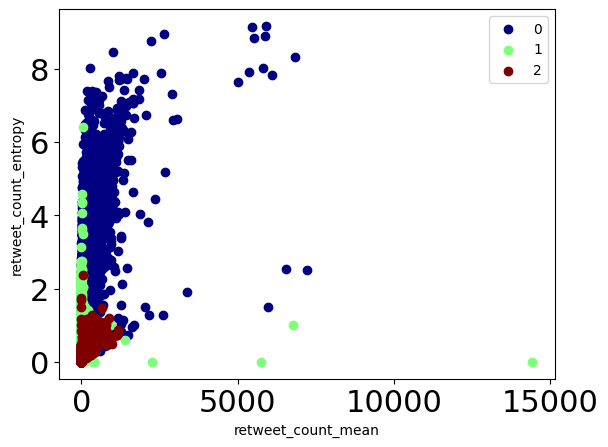

retweet_count_std - retweet_count_entropy


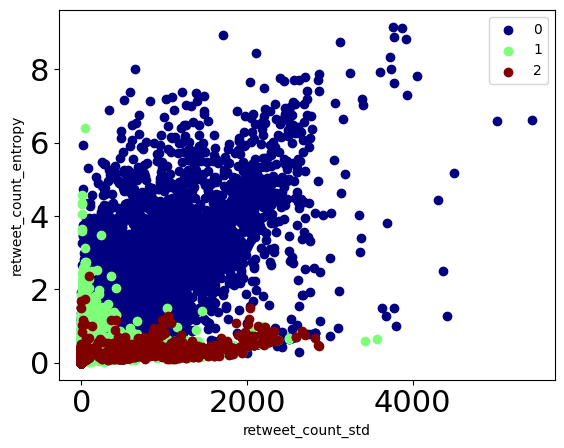

In [29]:
scatter_features_clusters(df_num, kmeans.labels_)

statuses_count - avg_length


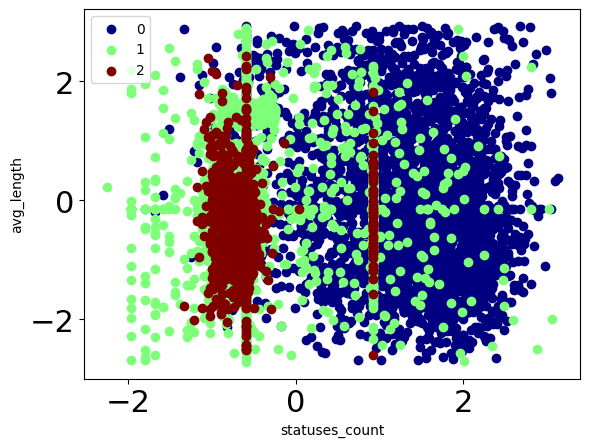

statuses_count - avg_special_chars


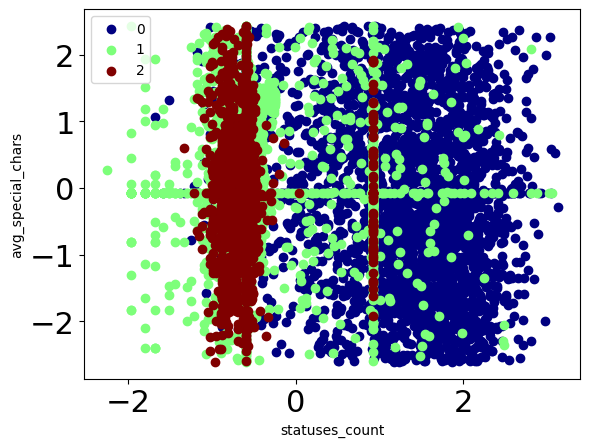

statuses_count - urls_ratio


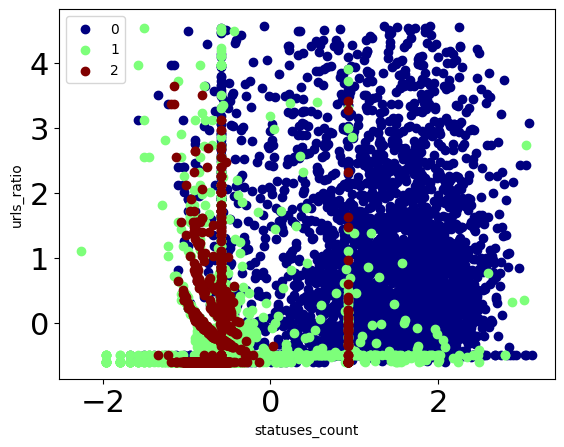

statuses_count - mentions_ratio


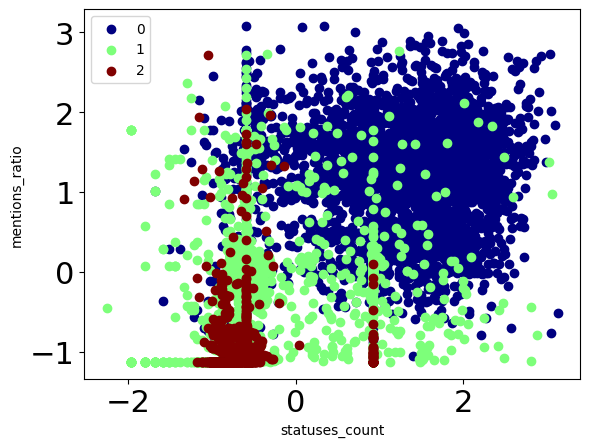

statuses_count - hashtags_ratio


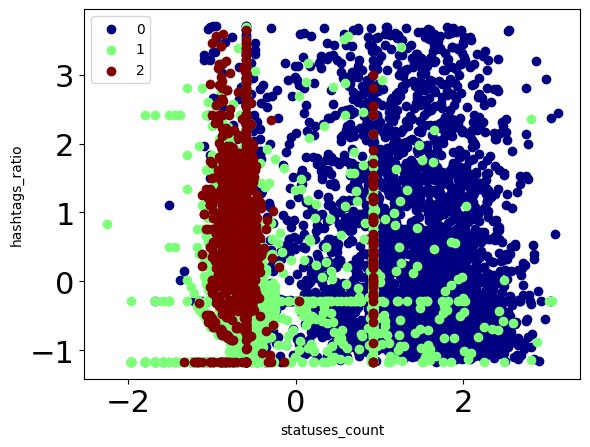

statuses_count - reply_count_mean


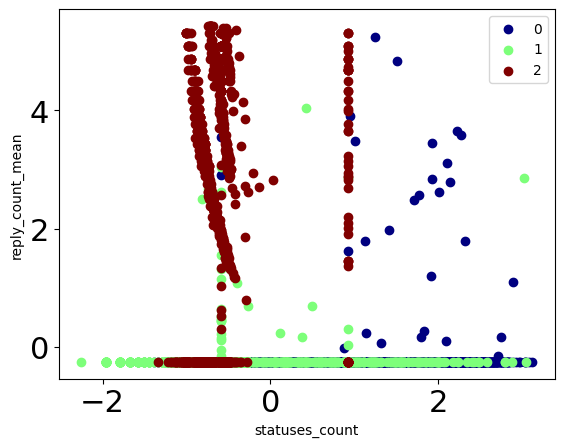

statuses_count - reply_count_std


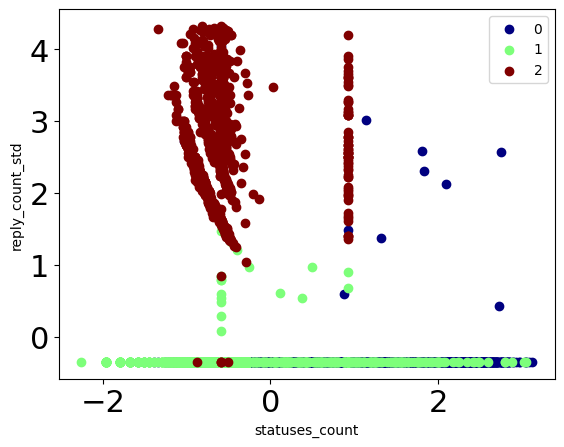

statuses_count - favorite_count_mean


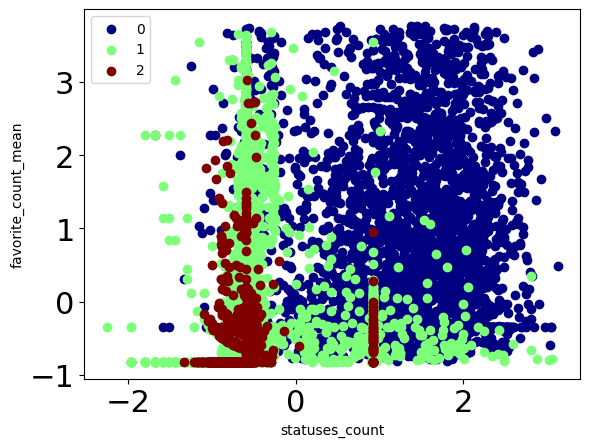

statuses_count - favorite_count_std


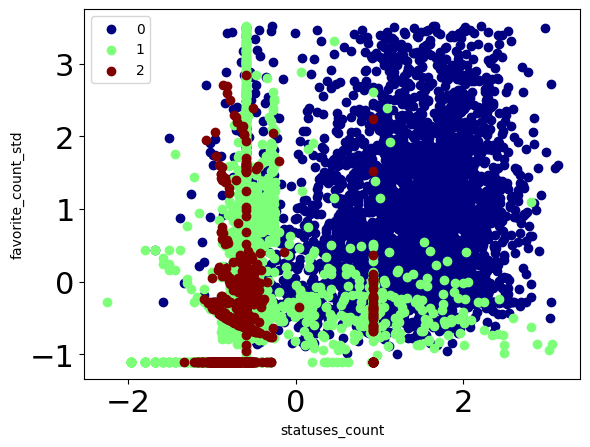

statuses_count - favorite_count_entropy


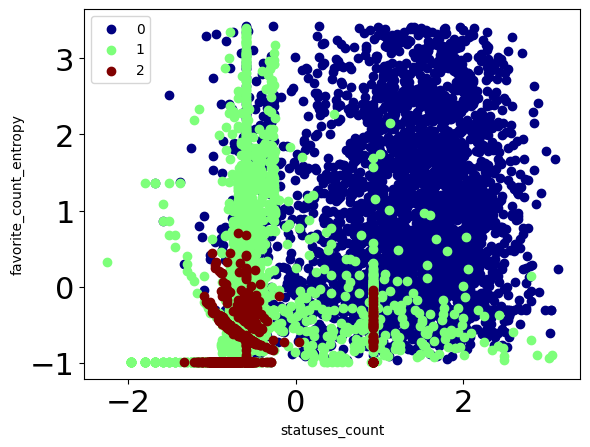

statuses_count - retweet_count_mean


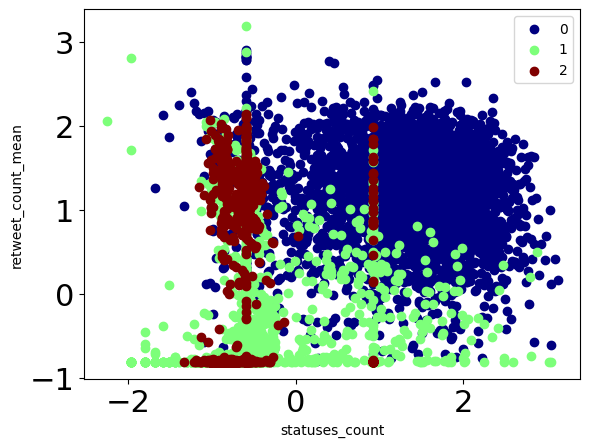

statuses_count - retweet_count_std


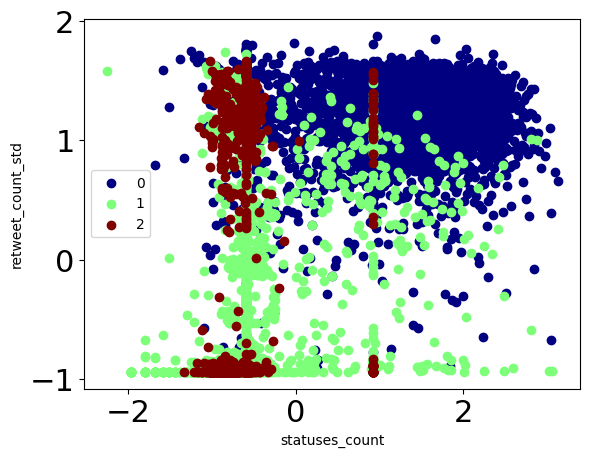

statuses_count - retweet_count_entropy


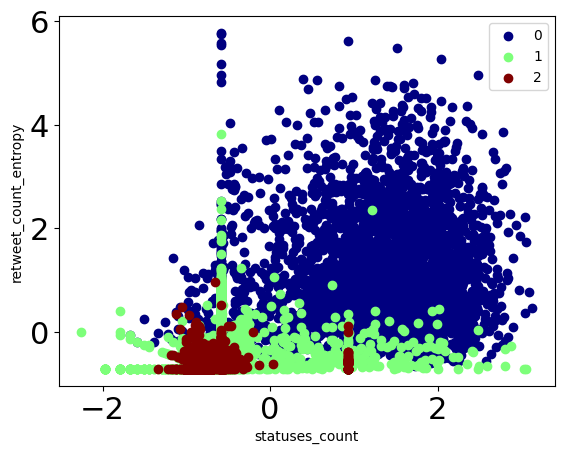

avg_length - avg_special_chars


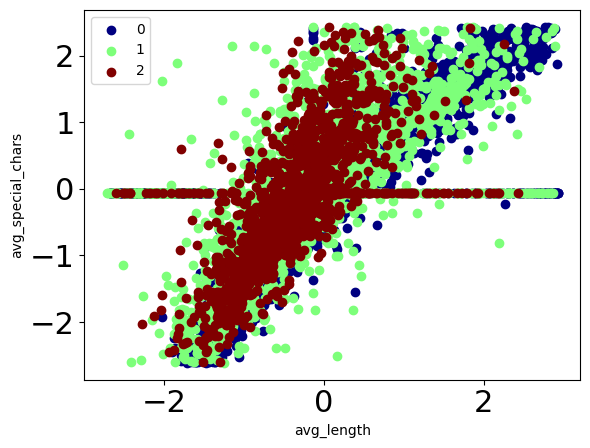

avg_length - urls_ratio


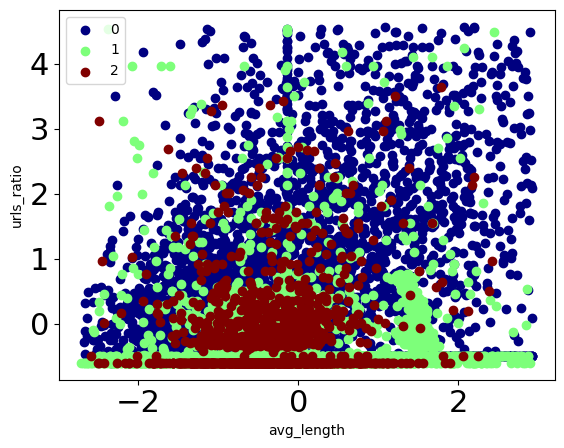

avg_length - mentions_ratio


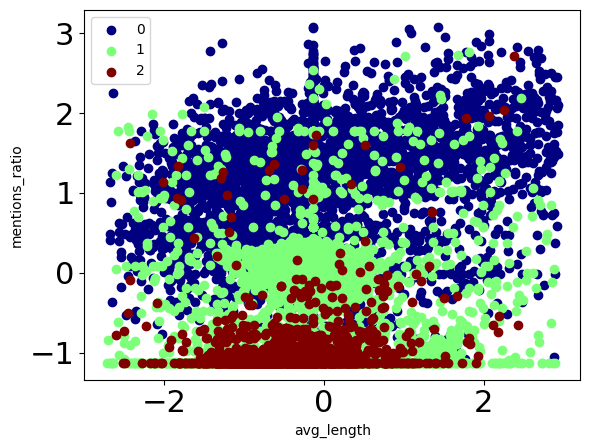

avg_length - hashtags_ratio


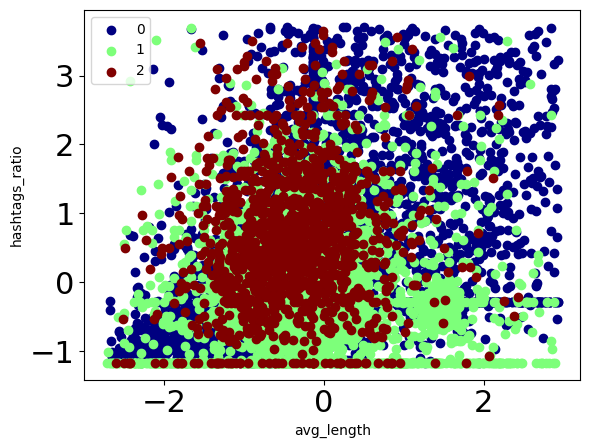

avg_length - reply_count_mean


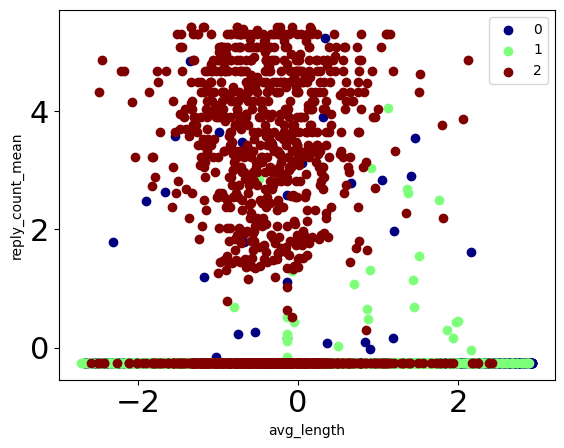

avg_length - reply_count_std


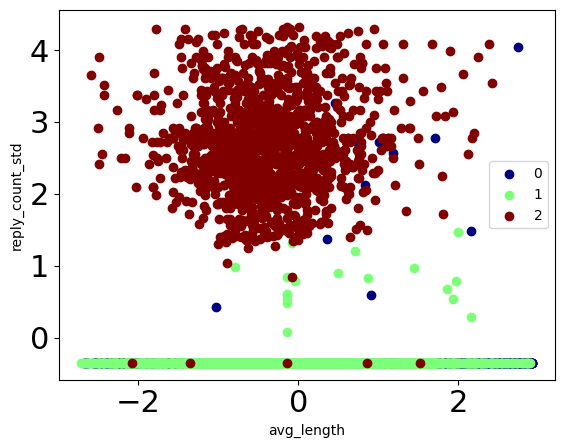

avg_length - favorite_count_mean


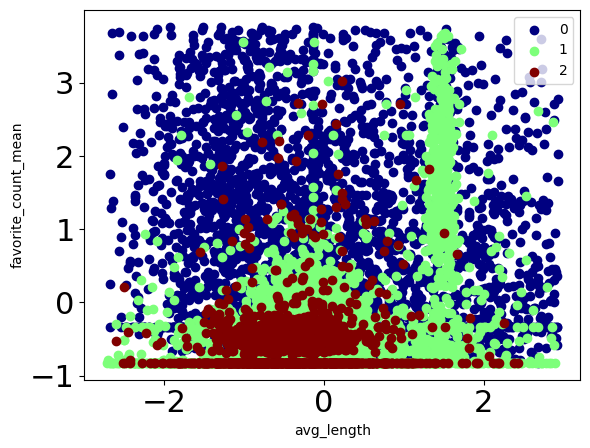

avg_length - favorite_count_std


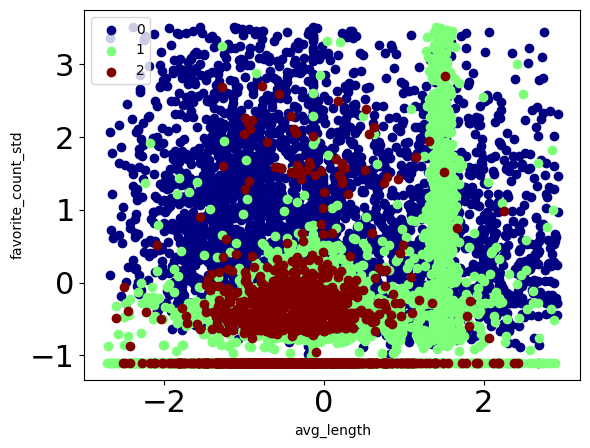

avg_length - favorite_count_entropy


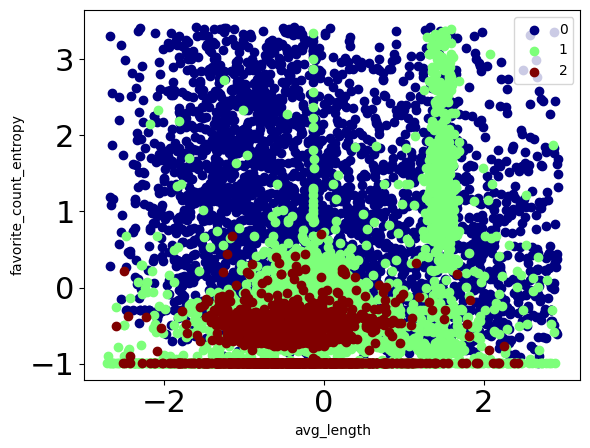

avg_length - retweet_count_mean


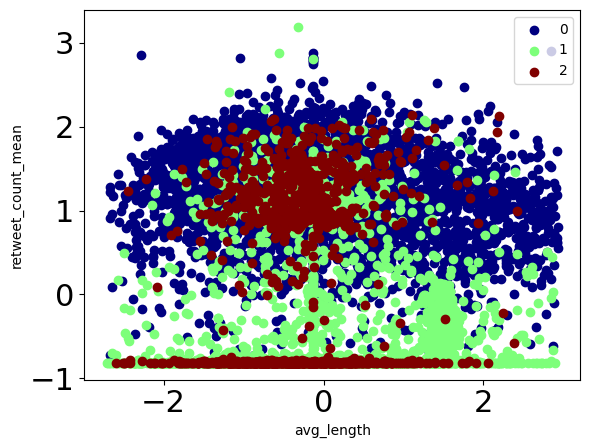

avg_length - retweet_count_std


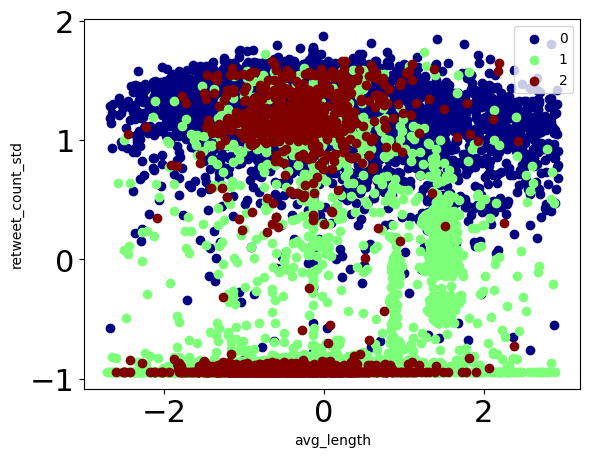

avg_length - retweet_count_entropy


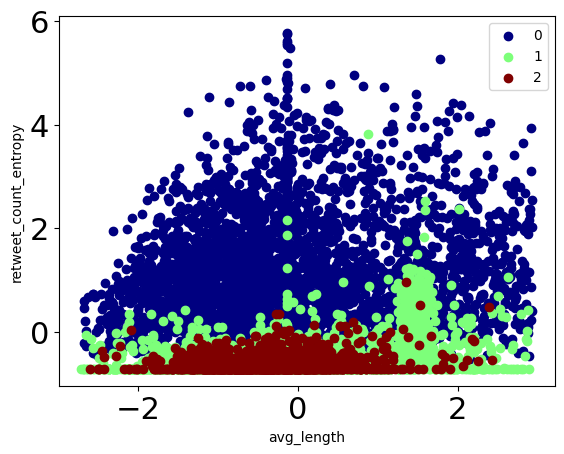

avg_special_chars - urls_ratio


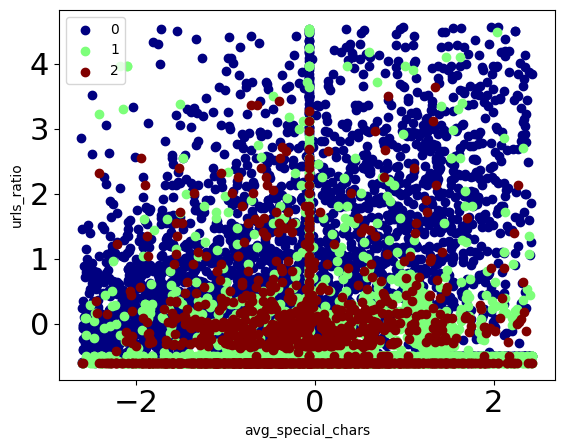

avg_special_chars - mentions_ratio


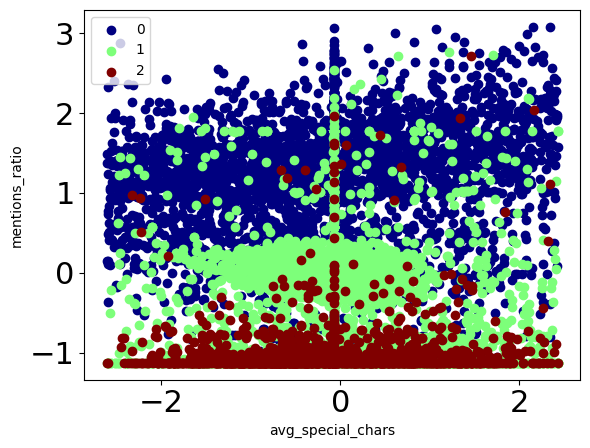

avg_special_chars - hashtags_ratio


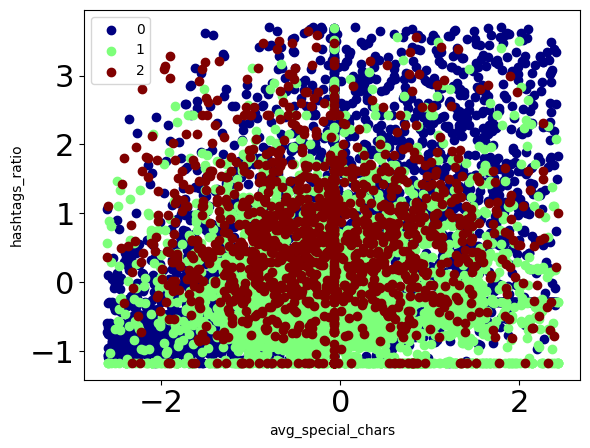

avg_special_chars - reply_count_mean


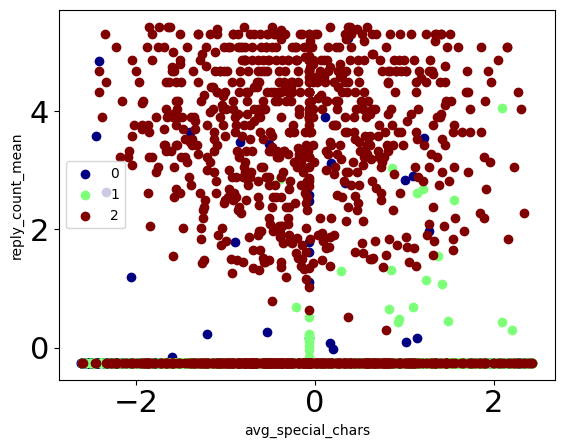

avg_special_chars - reply_count_std


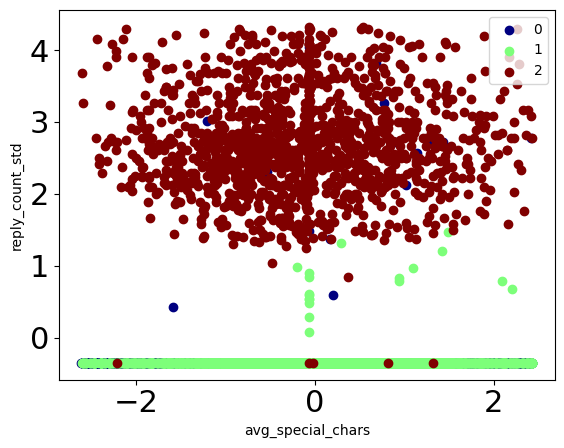

avg_special_chars - favorite_count_mean


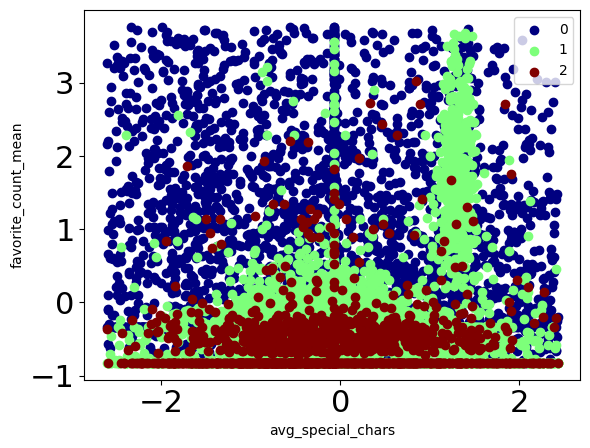

avg_special_chars - favorite_count_std


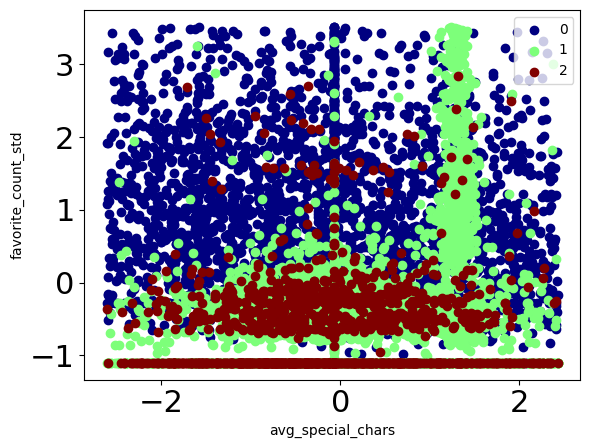

avg_special_chars - favorite_count_entropy


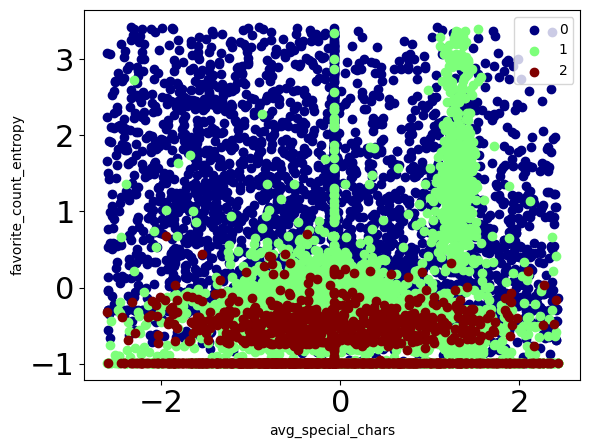

avg_special_chars - retweet_count_mean


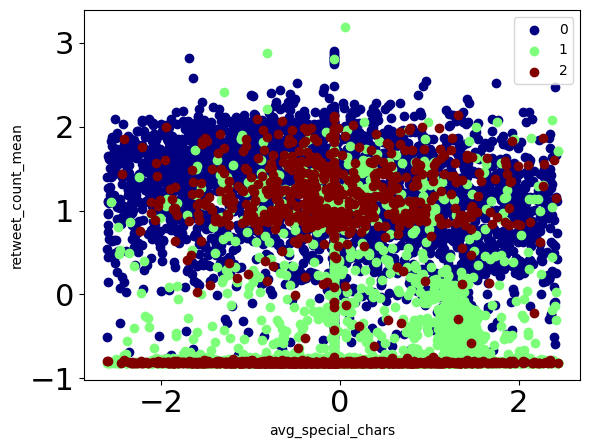

avg_special_chars - retweet_count_std


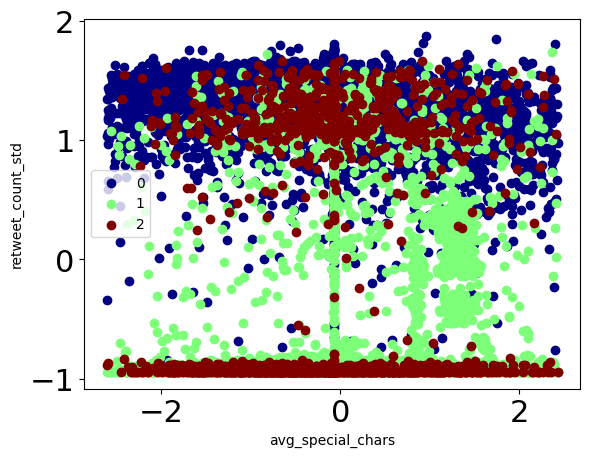

avg_special_chars - retweet_count_entropy


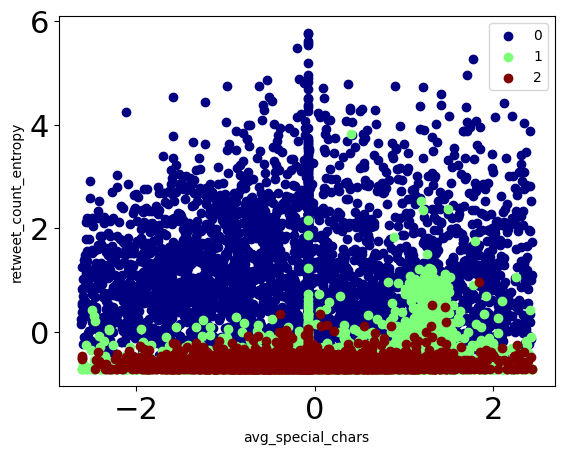

urls_ratio - mentions_ratio


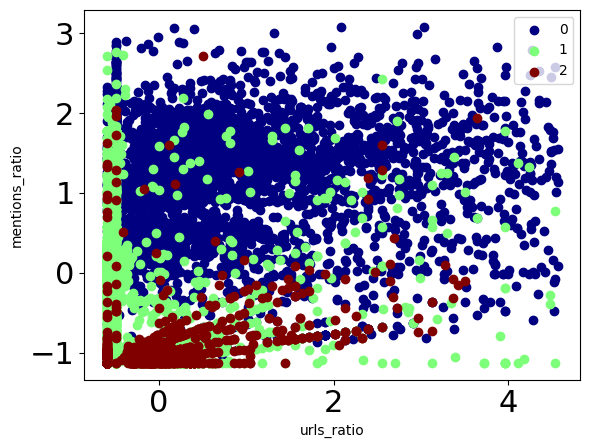

urls_ratio - hashtags_ratio


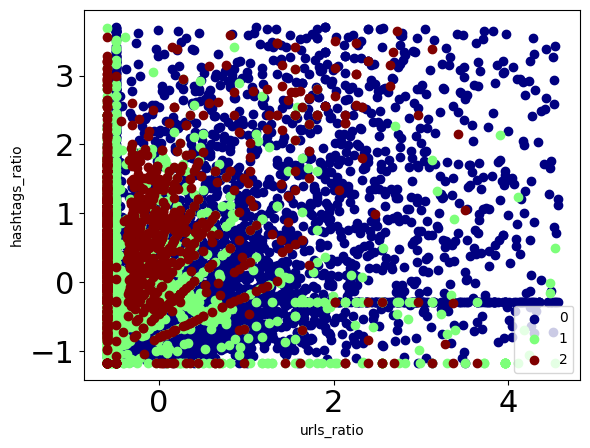

urls_ratio - reply_count_mean


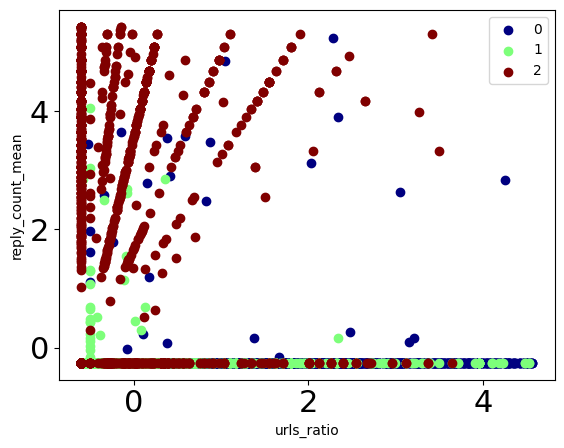

urls_ratio - reply_count_std


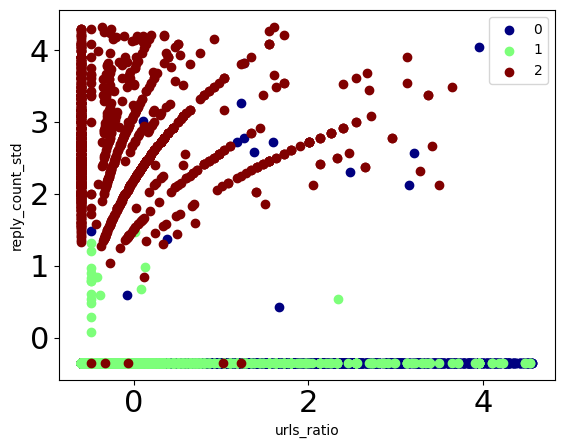

urls_ratio - favorite_count_mean


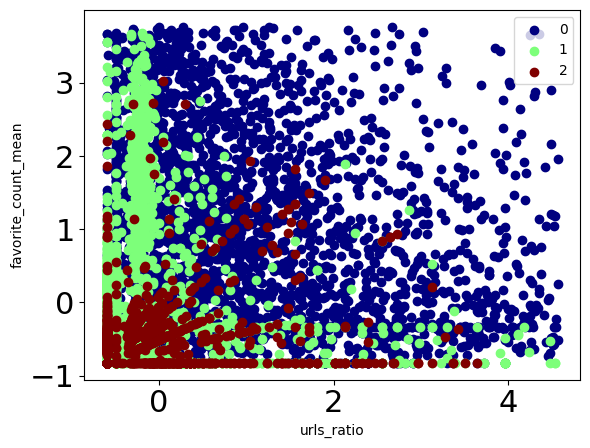

urls_ratio - favorite_count_std


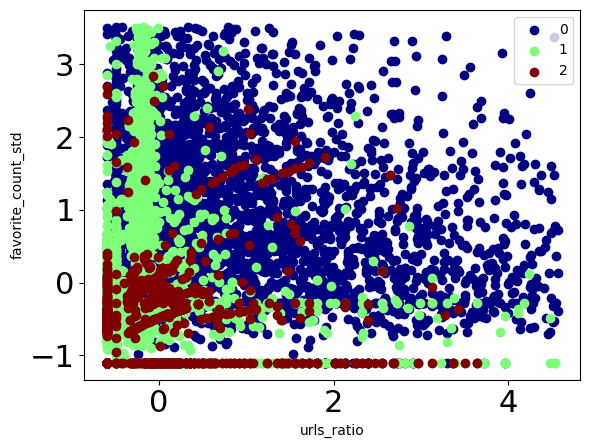

urls_ratio - favorite_count_entropy


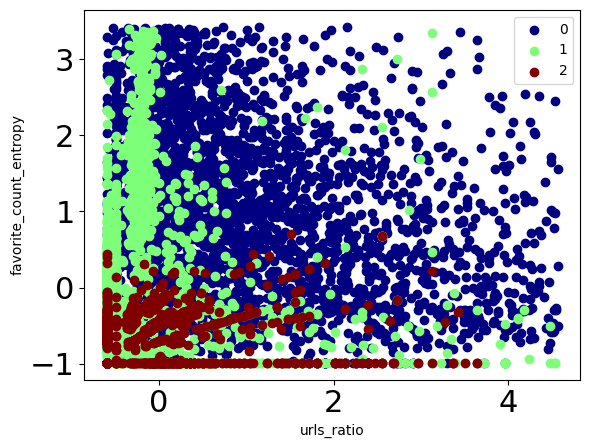

urls_ratio - retweet_count_mean


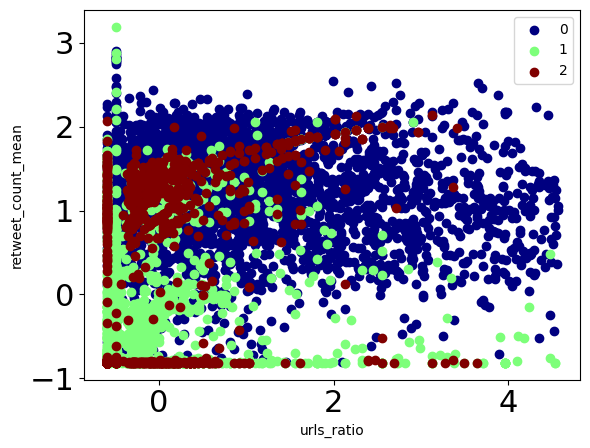

urls_ratio - retweet_count_std


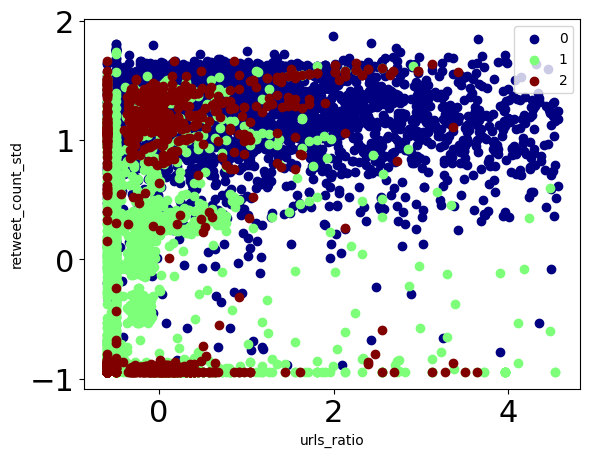

urls_ratio - retweet_count_entropy


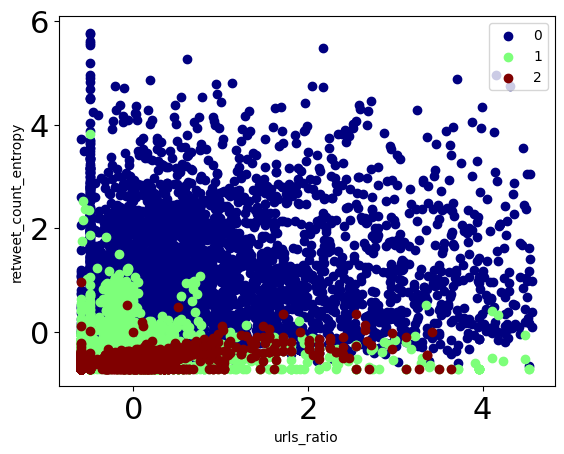

mentions_ratio - hashtags_ratio


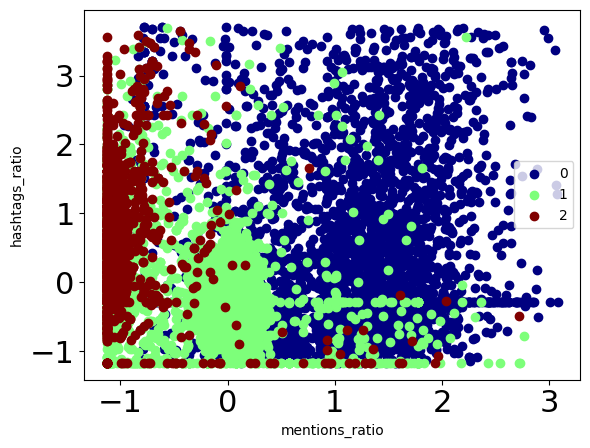

mentions_ratio - reply_count_mean


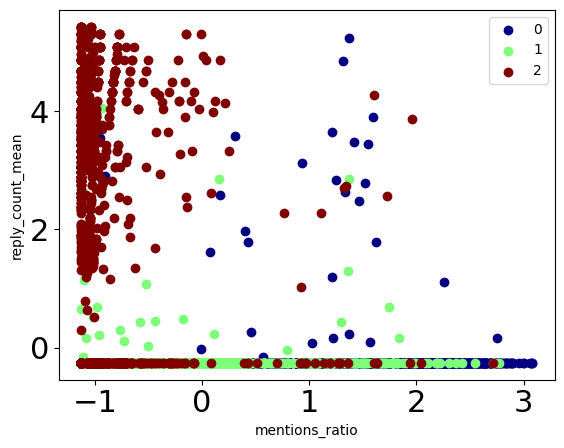

mentions_ratio - reply_count_std


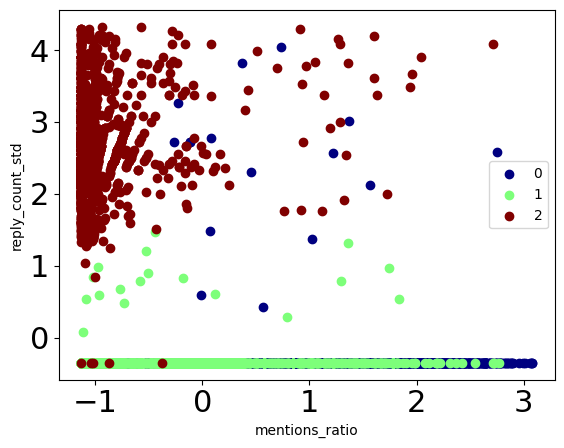

mentions_ratio - favorite_count_mean


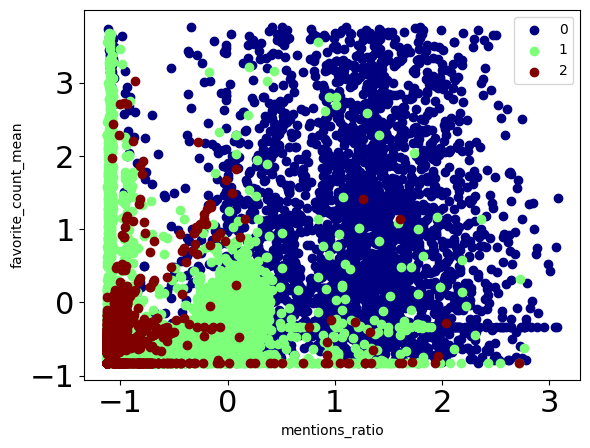

mentions_ratio - favorite_count_std


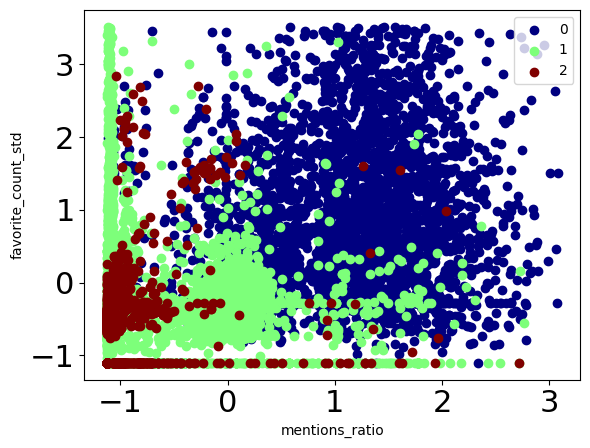

mentions_ratio - favorite_count_entropy


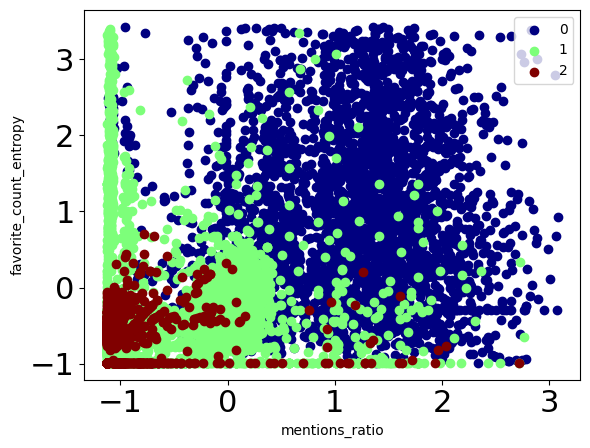

mentions_ratio - retweet_count_mean


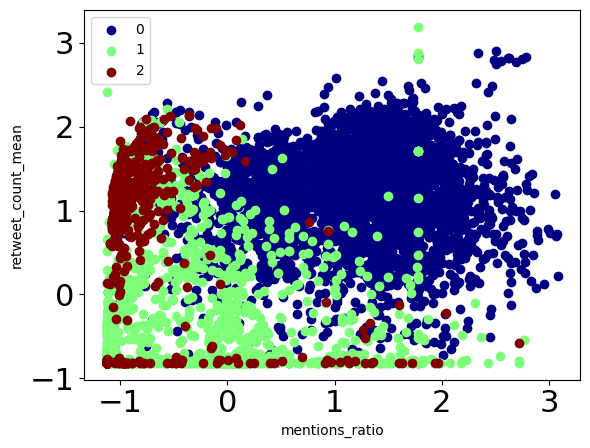

mentions_ratio - retweet_count_std


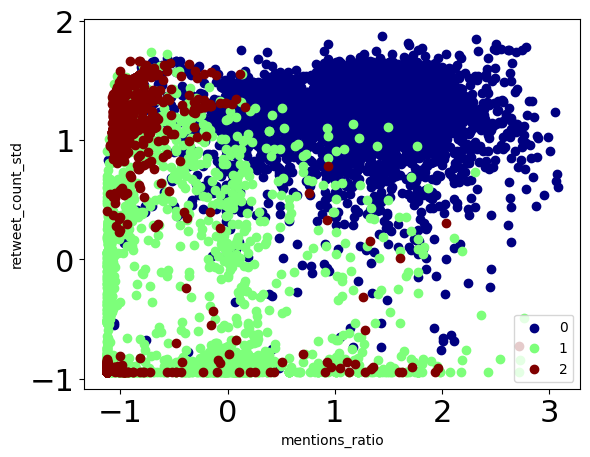

mentions_ratio - retweet_count_entropy


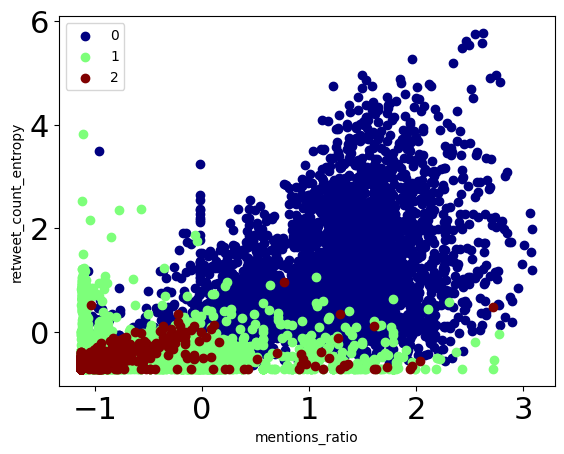

hashtags_ratio - reply_count_mean


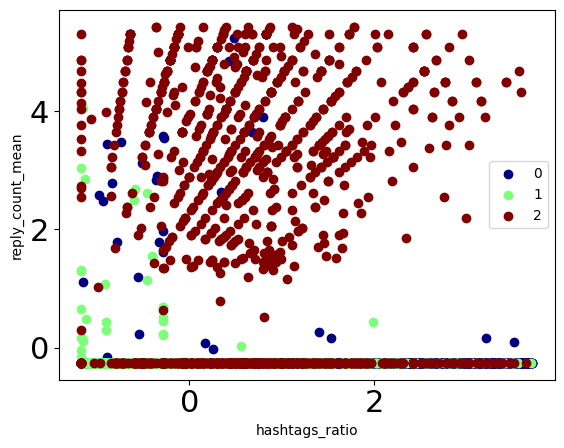

hashtags_ratio - reply_count_std


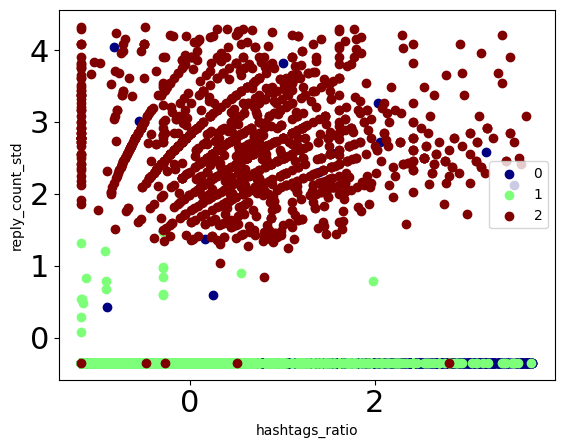

hashtags_ratio - favorite_count_mean


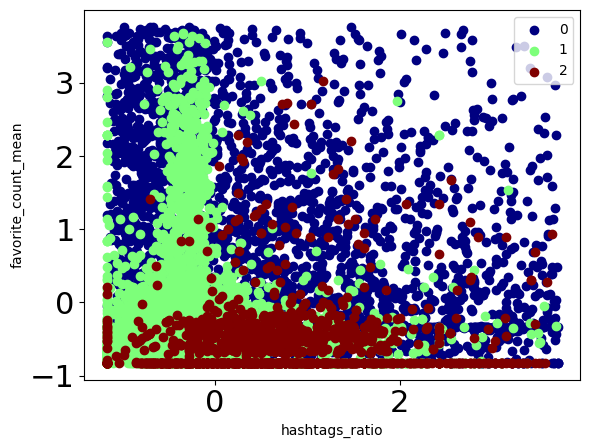

hashtags_ratio - favorite_count_std


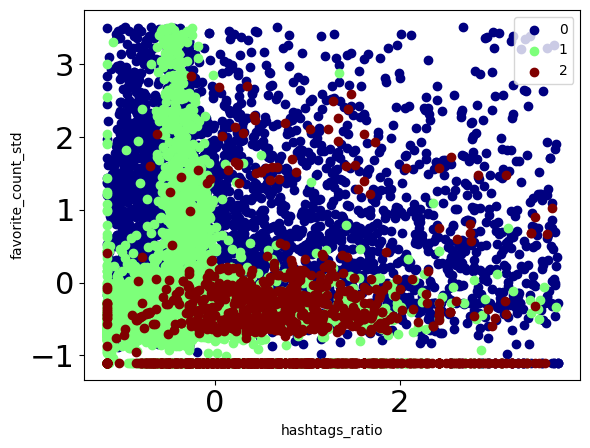

hashtags_ratio - favorite_count_entropy


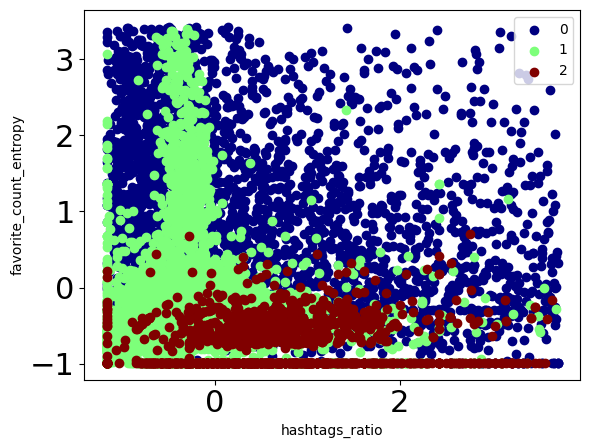

hashtags_ratio - retweet_count_mean


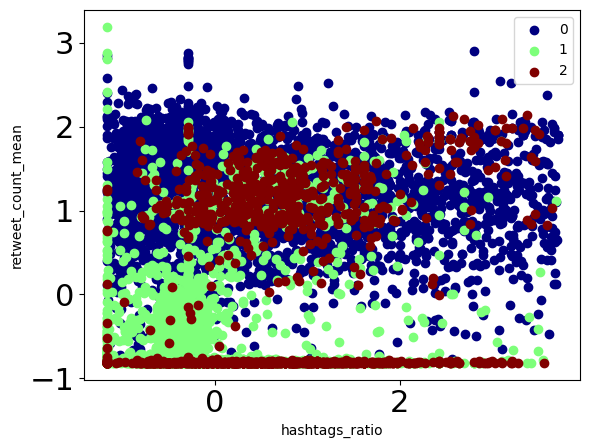

hashtags_ratio - retweet_count_std


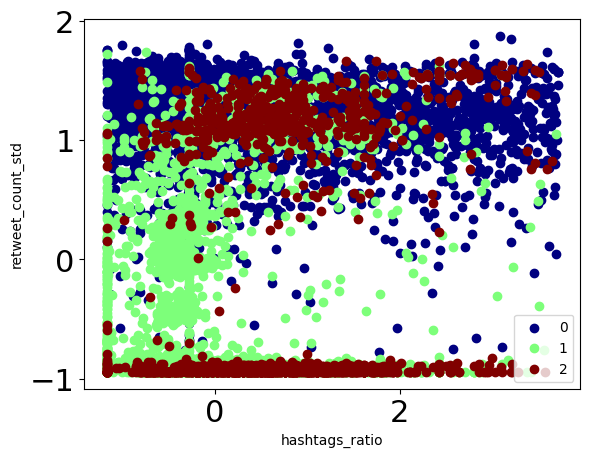

hashtags_ratio - retweet_count_entropy


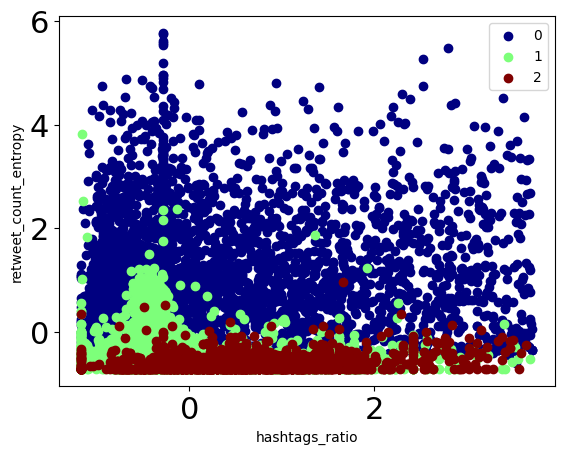

reply_count_mean - reply_count_std


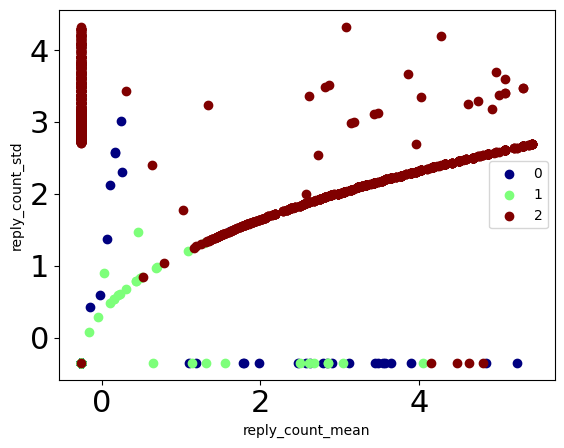

reply_count_mean - favorite_count_mean


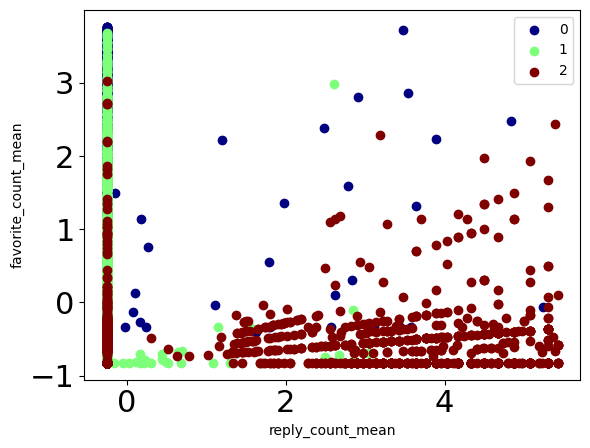

reply_count_mean - favorite_count_std


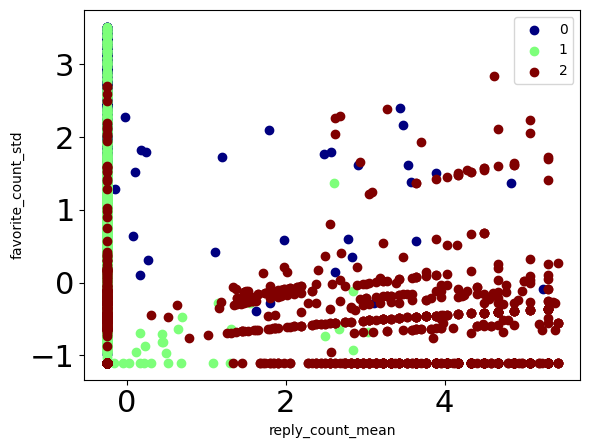

reply_count_mean - favorite_count_entropy


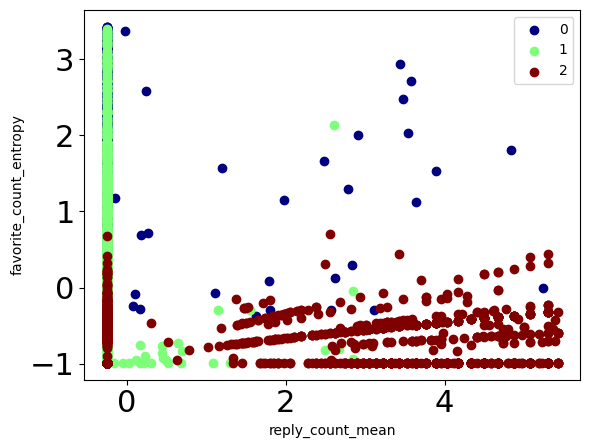

reply_count_mean - retweet_count_mean


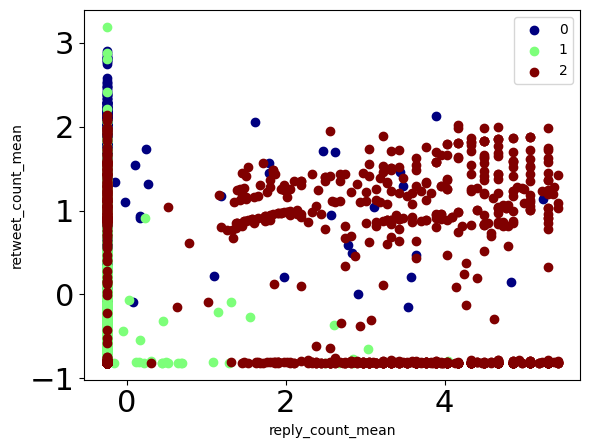

reply_count_mean - retweet_count_std


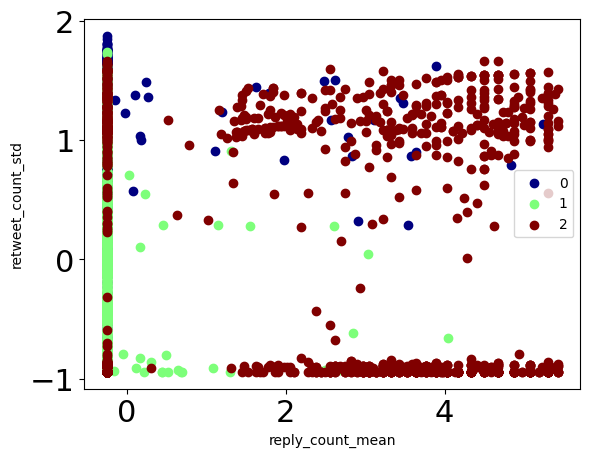

reply_count_mean - retweet_count_entropy


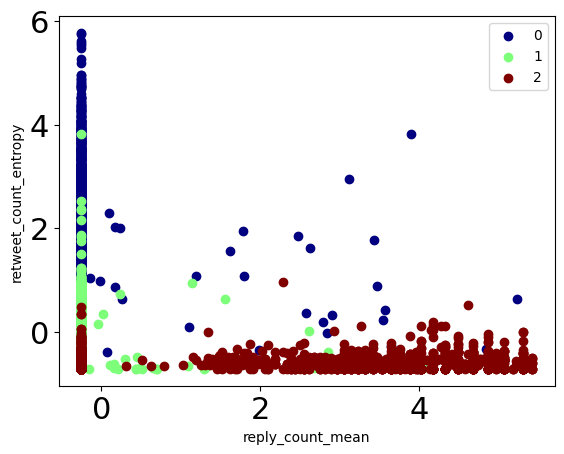

reply_count_std - favorite_count_mean


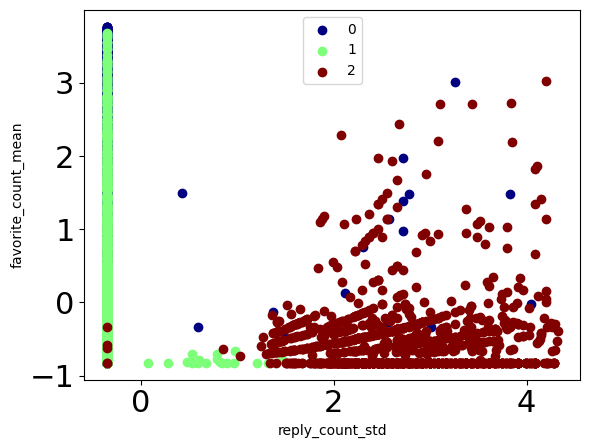

reply_count_std - favorite_count_std


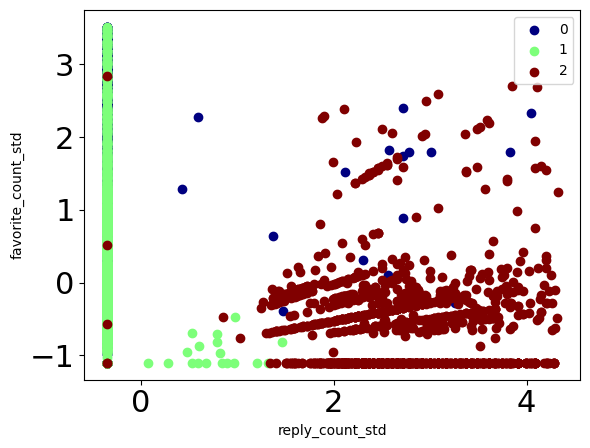

reply_count_std - favorite_count_entropy


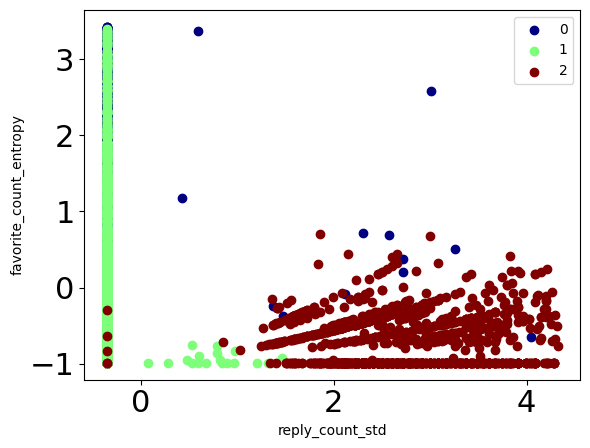

reply_count_std - retweet_count_mean


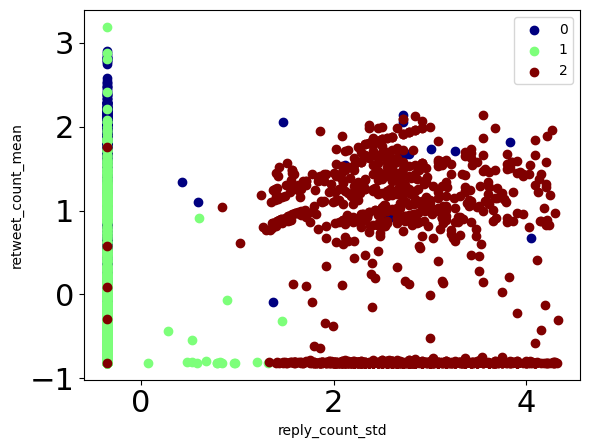

reply_count_std - retweet_count_std


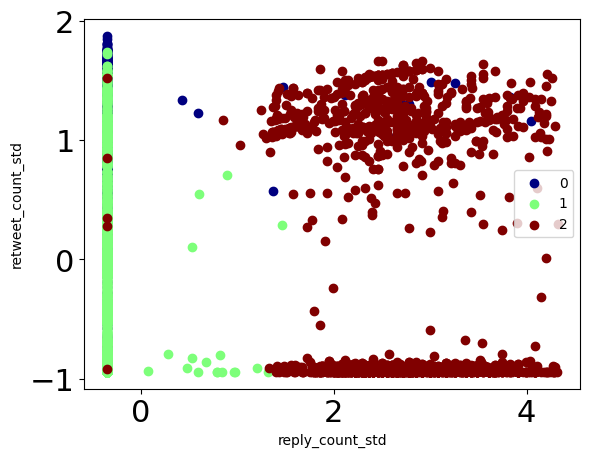

reply_count_std - retweet_count_entropy


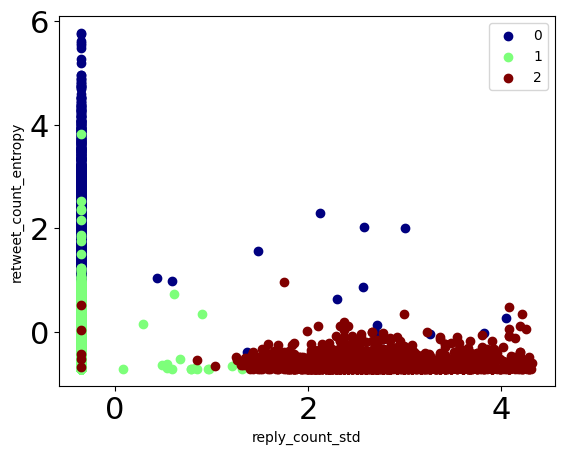

favorite_count_mean - favorite_count_std


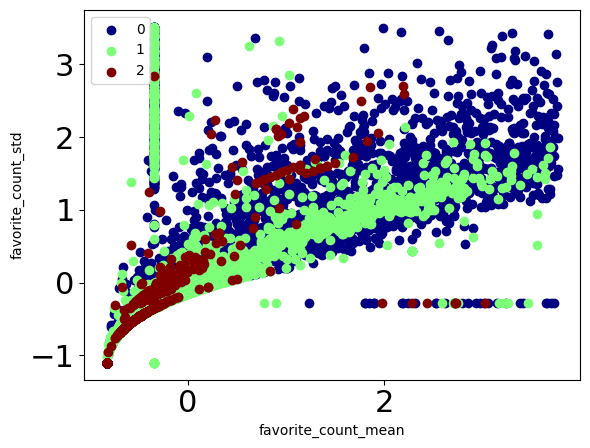

favorite_count_mean - favorite_count_entropy


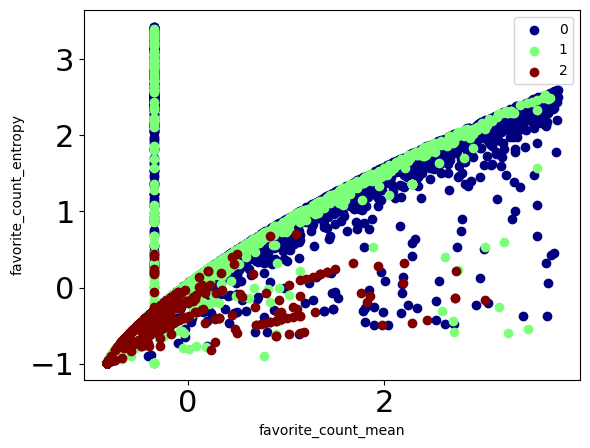

favorite_count_mean - retweet_count_mean


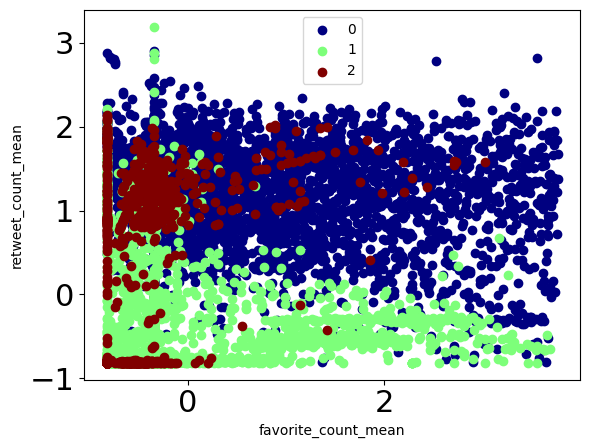

favorite_count_mean - retweet_count_std


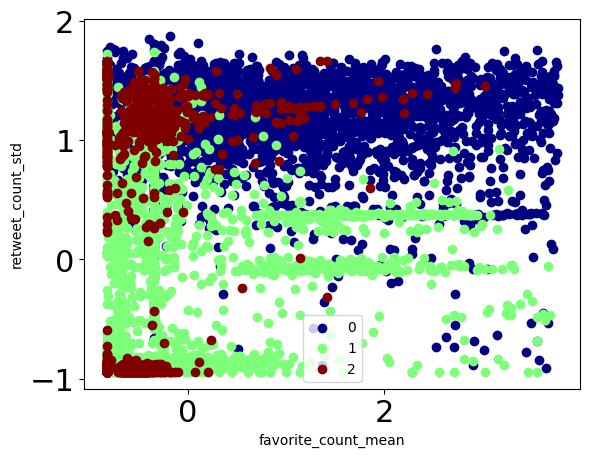

favorite_count_mean - retweet_count_entropy


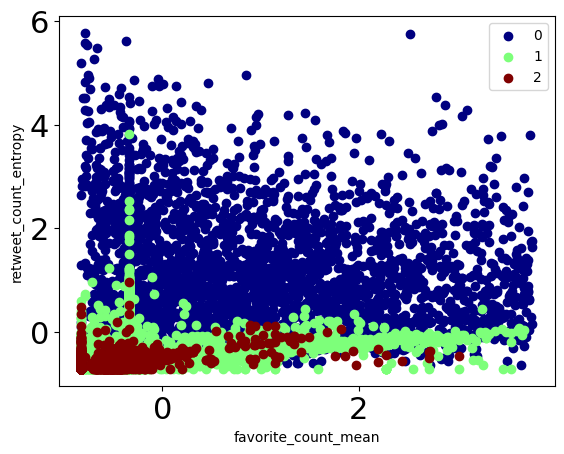

favorite_count_std - favorite_count_entropy


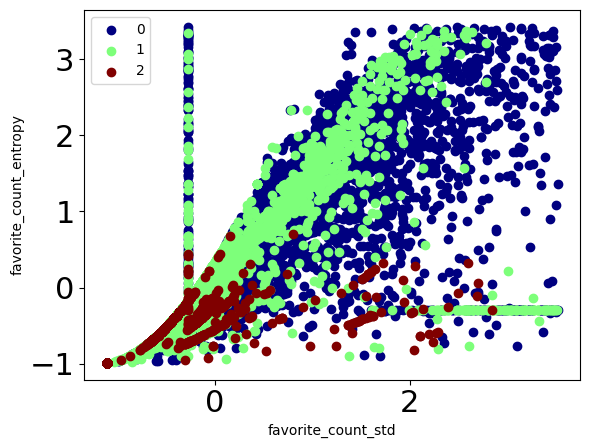

favorite_count_std - retweet_count_mean


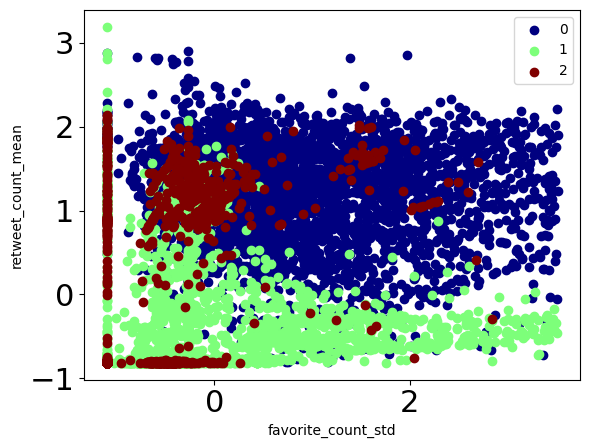

favorite_count_std - retweet_count_std


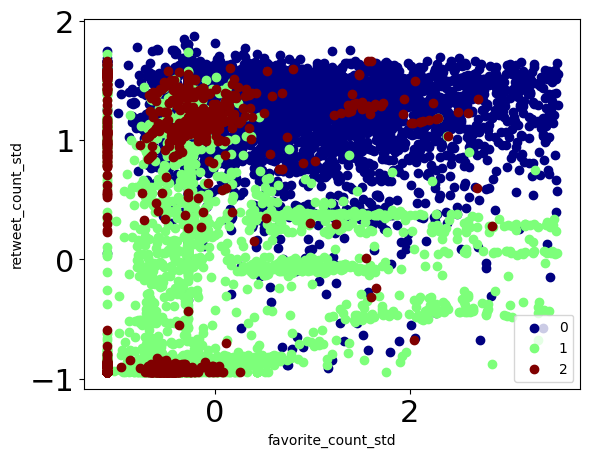

favorite_count_std - retweet_count_entropy


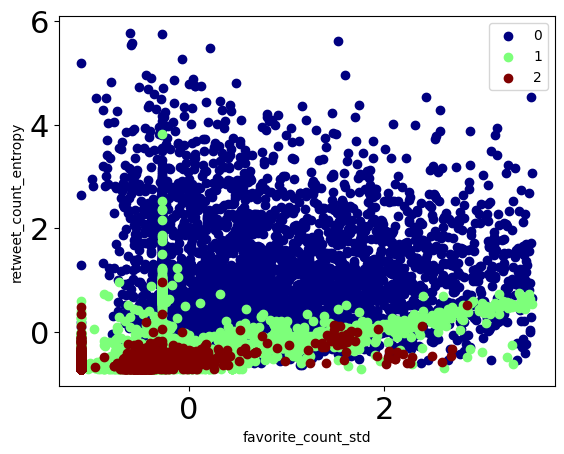

favorite_count_entropy - retweet_count_mean


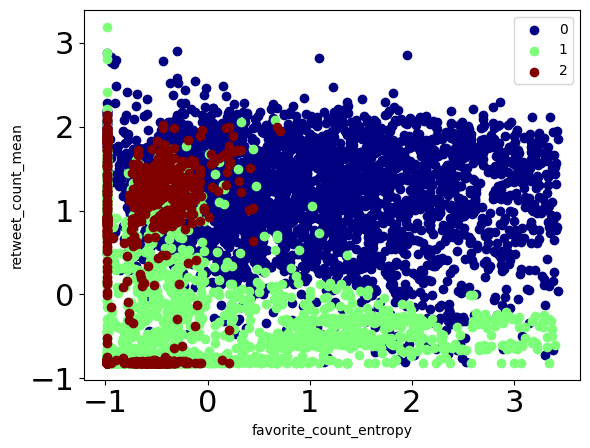

favorite_count_entropy - retweet_count_std


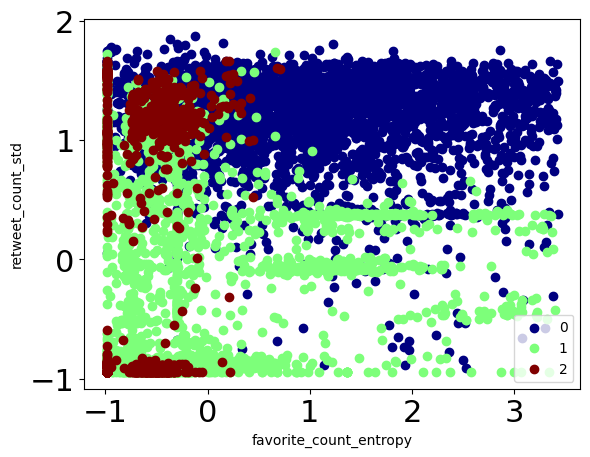

favorite_count_entropy - retweet_count_entropy


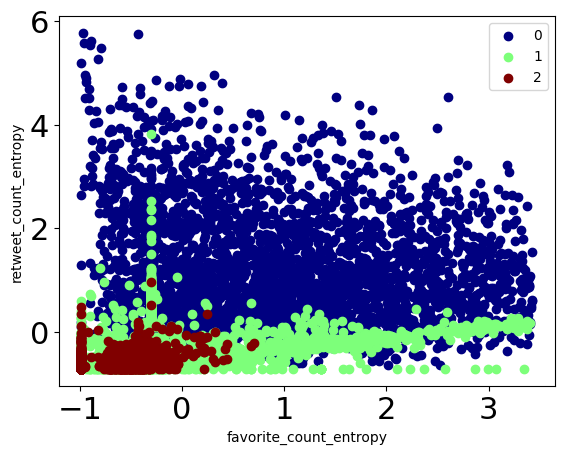

retweet_count_mean - retweet_count_std


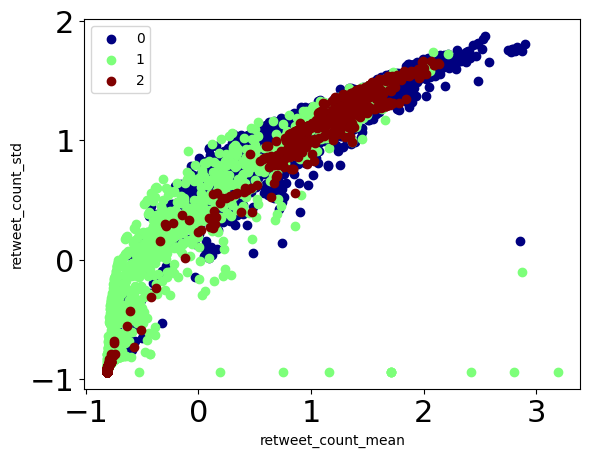

retweet_count_mean - retweet_count_entropy


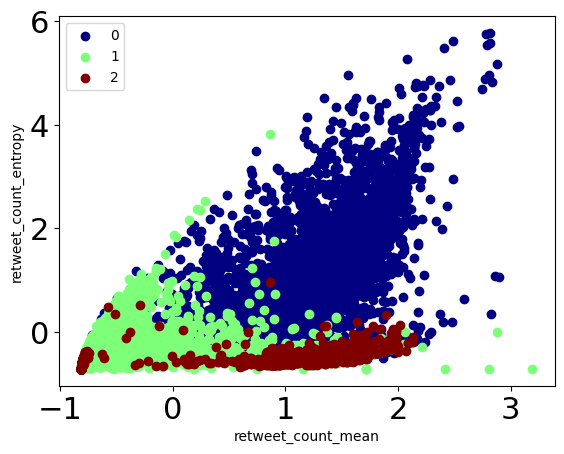

retweet_count_std - retweet_count_entropy


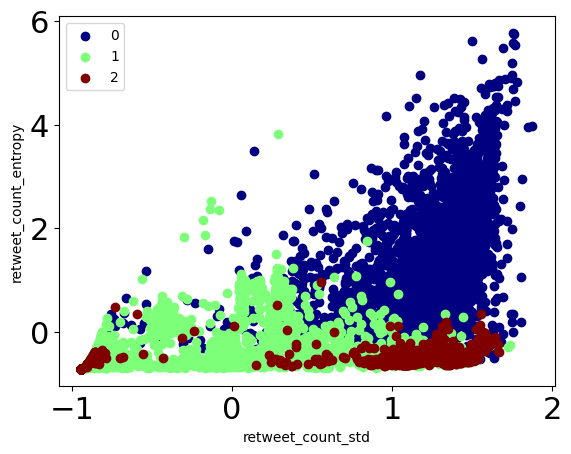

In [30]:
scatter_features_clusters(pd.DataFrame(X, columns=df_num.columns), kmeans.labels_)

### PCA
Apply PCA to visualize the scatter plot distribution of the clustered data

In [31]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

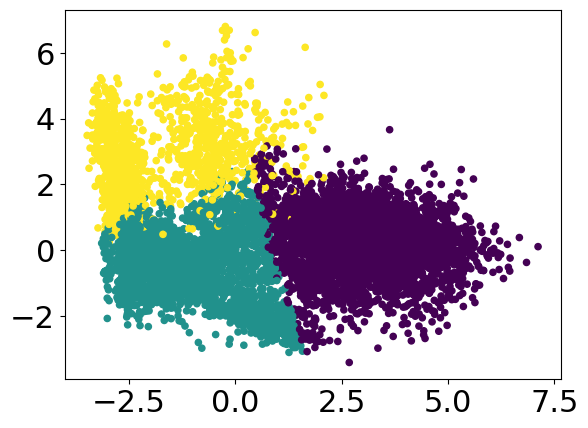

In [32]:
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=kmeans.labels_, s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.savefig("../images/clustering/kmeans_pca.png")
plt.show()

### Evaluation KMeans

Print the SSE, Silouette and Separation of the method selected out.

In [33]:
print('SSE %s' % kmeans.inertia_)
print('Silhouette %s' % silhouette_score(X, kmeans.labels_))
print('Separation %s' % metrics.davies_bouldin_score(X, kmeans.labels_))

SSE 94487.30936661956
Silhouette 0.3587422480706509
Separation 1.258287755664081
